# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

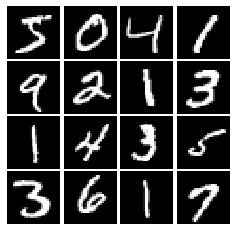

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, alpha * x)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)
    
#     initializer = tf.random_uniform_initializer(minval=-1, maxval=1)
#     noise = initializer(shape=[batch_size, dim])
    
#     return noise

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(units=256, name='first_fc'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(units=256, name='second_fc'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(units=1, name='logits')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Incorrect number of parameters in discriminator. 0.0 instead of 267009. Check your achitecture.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(units=noise_dim, name='fc1'),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(units=1024, name='fc2'),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(units=784, name='fc3', activation='tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Incorrect number of parameters in generator. 0.0 instead of 1858320. Check your achitecture.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    labels_real = tf.ones_like(logits_real)
    labels_fake = tf.zeros_like(logits_fake)
    
#     loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels_real, logits=logits_real)) + \
#            tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels_fake, logits=logits_fake))
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = cross_entropy(labels_real, logits_real) + cross_entropy(labels_fake, logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    labels_fake = tf.ones_like(logits_fake)
#     loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels_fake, logits=logits_fake))
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = cross_entropy(labels_fake, logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.801, G:0.7419


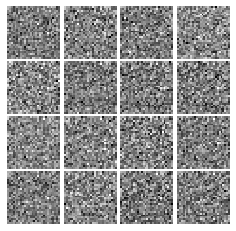

Epoch: 0, Iter: 20, D: 0.5468, G:1.133


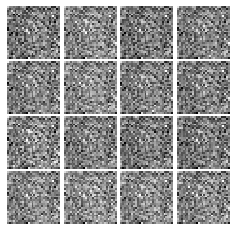

Epoch: 0, Iter: 40, D: 0.3941, G:1.457


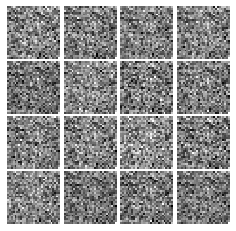

Epoch: 0, Iter: 60, D: 3.012, G:0.362


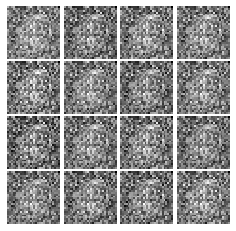

Epoch: 0, Iter: 80, D: 0.893, G:1.541


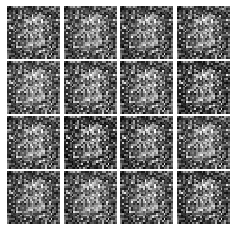

Epoch: 0, Iter: 100, D: 1.95, G:1.677


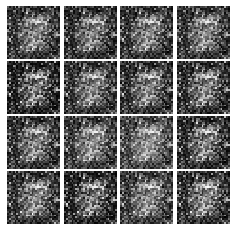

Epoch: 0, Iter: 120, D: 1.486, G:1.286


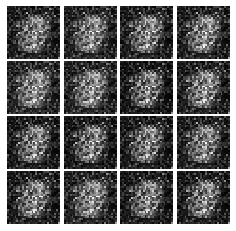

Epoch: 0, Iter: 140, D: 1.715, G:0.7669


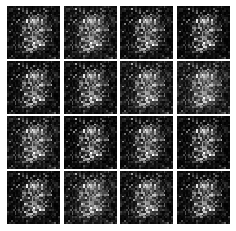

Epoch: 0, Iter: 160, D: 0.8692, G:1.014


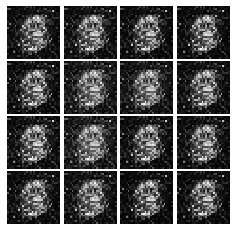

Epoch: 0, Iter: 180, D: 0.9698, G:1.001


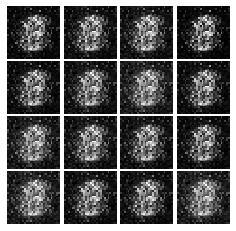

Epoch: 0, Iter: 200, D: 1.259, G:1.434


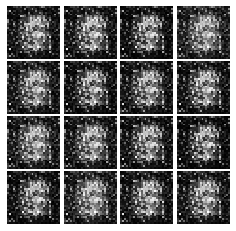

Epoch: 0, Iter: 220, D: 0.8544, G:1.571


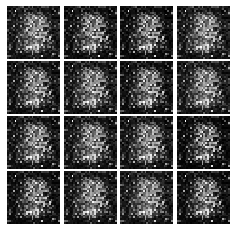

Epoch: 0, Iter: 240, D: 0.5795, G:1.714


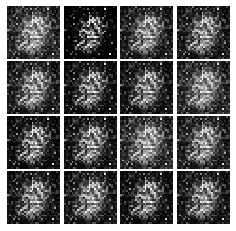

Epoch: 0, Iter: 260, D: 0.9659, G:1.935


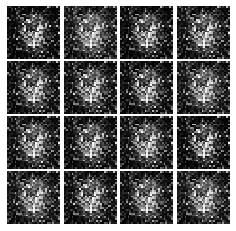

Epoch: 0, Iter: 280, D: 0.6545, G:1.55


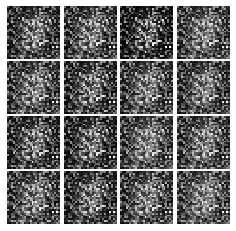

Epoch: 0, Iter: 300, D: 1.587, G:0.7143


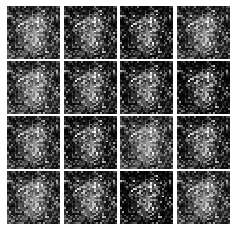

Epoch: 0, Iter: 320, D: 0.5458, G:2.953


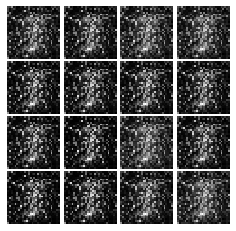

Epoch: 0, Iter: 340, D: 1.097, G:1.584


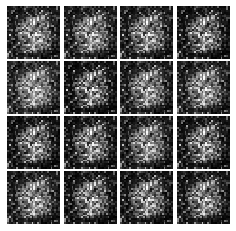

Epoch: 0, Iter: 360, D: 0.5693, G:1.764


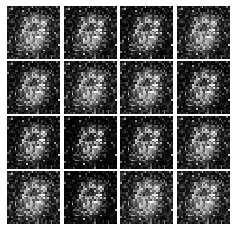

Epoch: 0, Iter: 380, D: 0.8022, G:2.667


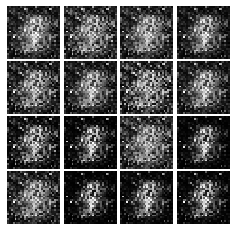

Epoch: 0, Iter: 400, D: 2.055, G:1.089


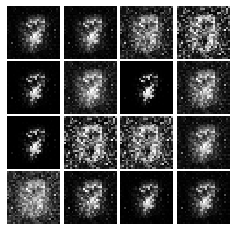

Epoch: 0, Iter: 420, D: 0.798, G:1.811


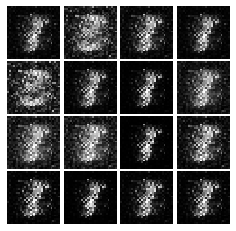

Epoch: 0, Iter: 440, D: 0.8321, G:1.709


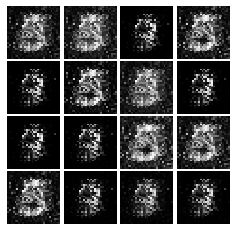

Epoch: 0, Iter: 460, D: 0.7766, G:2.723


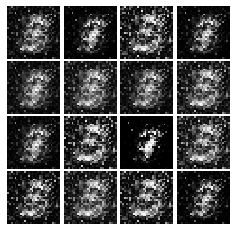

Epoch: 1, Iter: 480, D: 0.7282, G:1.634


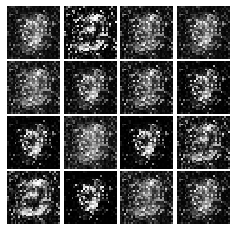

Epoch: 1, Iter: 500, D: 0.9269, G:0.9338


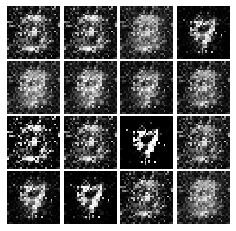

Epoch: 1, Iter: 520, D: 0.9861, G:1.928


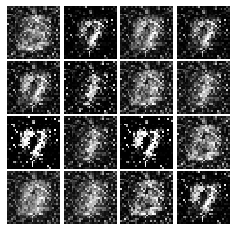

Epoch: 1, Iter: 540, D: 1.777, G:3.458


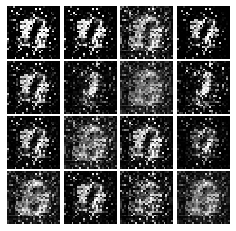

Epoch: 1, Iter: 560, D: 0.9566, G:1.794


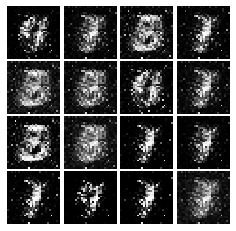

Epoch: 1, Iter: 580, D: 0.6094, G:1.927


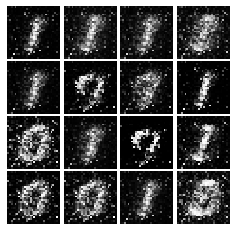

Epoch: 1, Iter: 600, D: 0.8165, G:1.817


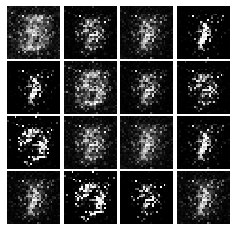

Epoch: 1, Iter: 620, D: 1.231, G:1.518


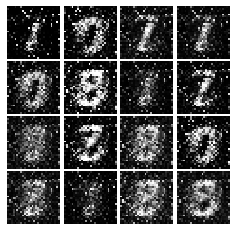

Epoch: 1, Iter: 640, D: 0.692, G:2.47


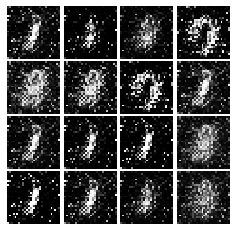

Epoch: 1, Iter: 660, D: 1.056, G:1.537


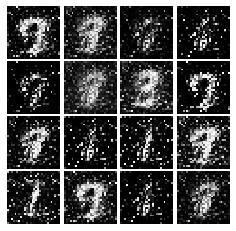

Epoch: 1, Iter: 680, D: 1.135, G:0.5883


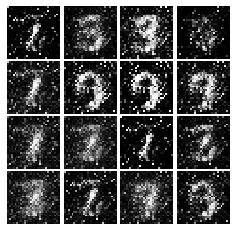

Epoch: 1, Iter: 700, D: 0.9846, G:0.8846


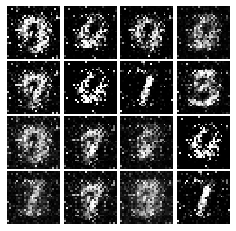

Epoch: 1, Iter: 720, D: 1.037, G:1.722


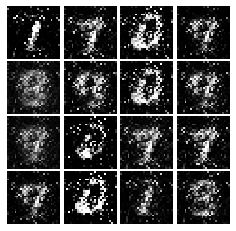

Epoch: 1, Iter: 740, D: 0.8308, G:1.533


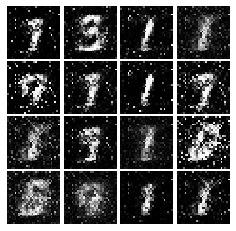

Epoch: 1, Iter: 760, D: 1.062, G:1.256


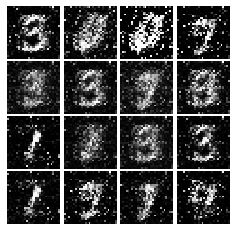

Epoch: 1, Iter: 780, D: 0.8678, G:1.052


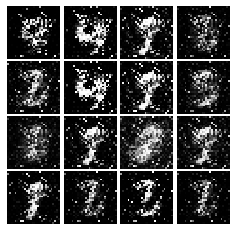

Epoch: 1, Iter: 800, D: 1.237, G:0.8538


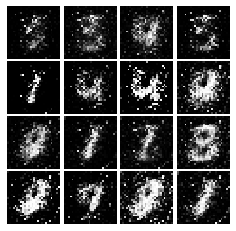

Epoch: 1, Iter: 820, D: 1.412, G:1.161


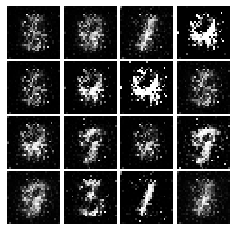

Epoch: 1, Iter: 840, D: 1.033, G:1.226


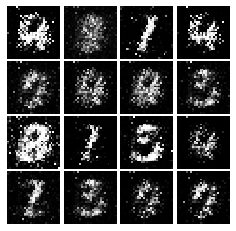

Epoch: 1, Iter: 860, D: 0.8618, G:1.438


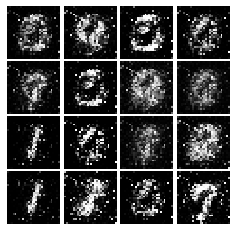

Epoch: 1, Iter: 880, D: 1.39, G:3.032


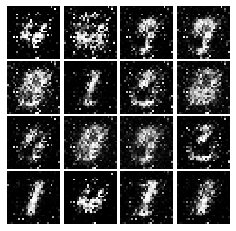

Epoch: 1, Iter: 900, D: 0.941, G:1.902


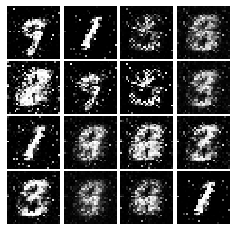

Epoch: 1, Iter: 920, D: 1.104, G:1.227


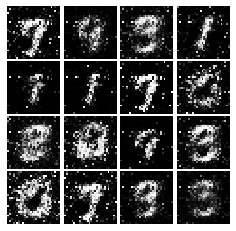

Epoch: 2, Iter: 940, D: 0.9717, G:1.421


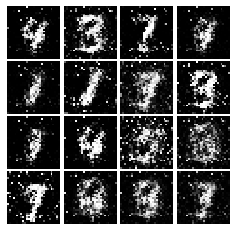

Epoch: 2, Iter: 960, D: 1.062, G:1.011


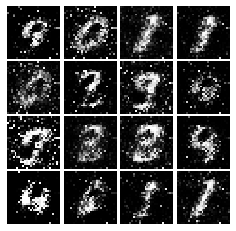

Epoch: 2, Iter: 980, D: 0.7507, G:1.9


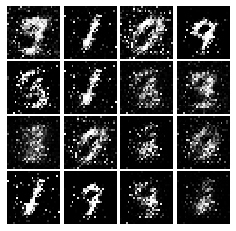

Epoch: 2, Iter: 1000, D: 0.993, G:2.177


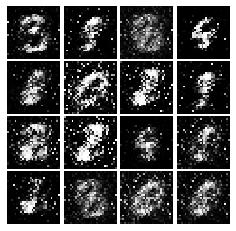

Epoch: 2, Iter: 1020, D: 1.025, G:1.517


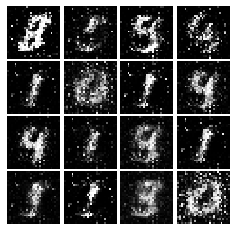

Epoch: 2, Iter: 1040, D: 1.257, G:1.752


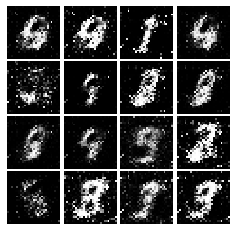

Epoch: 2, Iter: 1060, D: 1.005, G:1.37


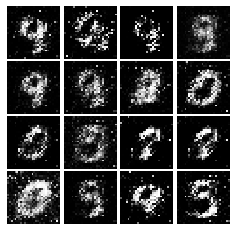

Epoch: 2, Iter: 1080, D: 1.011, G:1.397


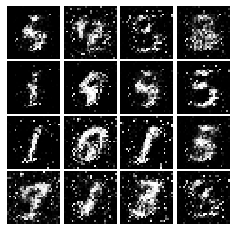

Epoch: 2, Iter: 1100, D: 0.9622, G:2.193


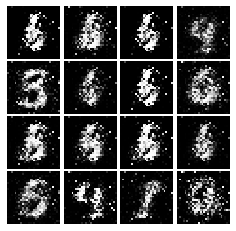

Epoch: 2, Iter: 1120, D: 1.122, G:1.5


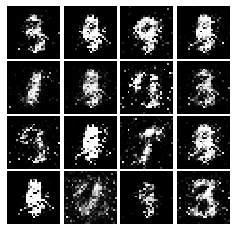

Epoch: 2, Iter: 1140, D: 1.009, G:1.478


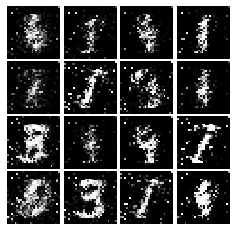

Epoch: 2, Iter: 1160, D: 0.8413, G:1.965


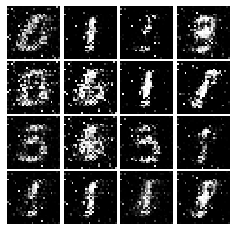

Epoch: 2, Iter: 1180, D: 1.026, G:1.197


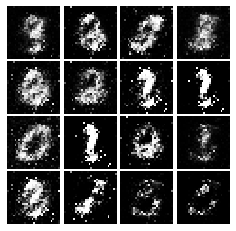

Epoch: 2, Iter: 1200, D: 1.06, G:1.535


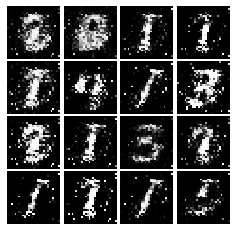

Epoch: 2, Iter: 1220, D: 1.055, G:1.254


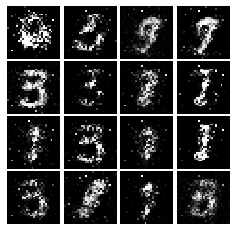

Epoch: 2, Iter: 1240, D: 1.08, G:1.521


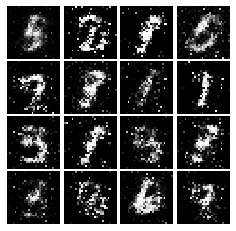

Epoch: 2, Iter: 1260, D: 0.9366, G:1.535


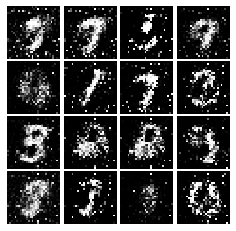

Epoch: 2, Iter: 1280, D: 1.073, G:1.156


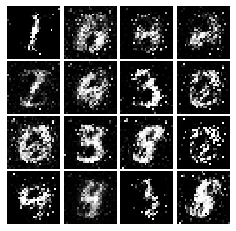

Epoch: 2, Iter: 1300, D: 1.087, G:1.458


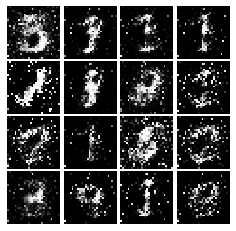

Epoch: 2, Iter: 1320, D: 1.145, G:1.057


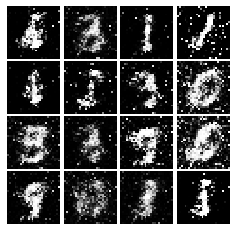

Epoch: 2, Iter: 1340, D: 1.005, G:0.6943


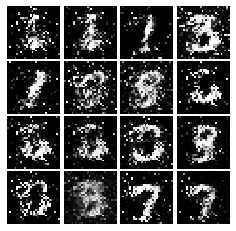

Epoch: 2, Iter: 1360, D: 1.12, G:1.171


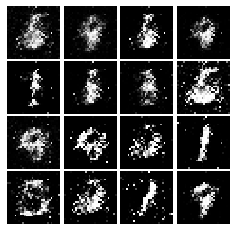

Epoch: 2, Iter: 1380, D: 1.059, G:1.137


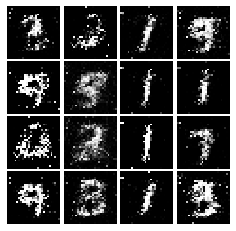

Epoch: 2, Iter: 1400, D: 0.8139, G:2.736


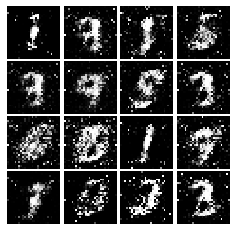

Epoch: 3, Iter: 1420, D: 1.231, G:1.091


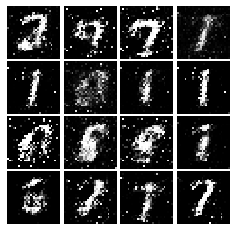

Epoch: 3, Iter: 1440, D: 1.133, G:1.219


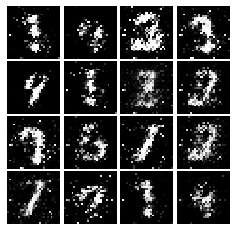

Epoch: 3, Iter: 1460, D: 1.257, G:1.307


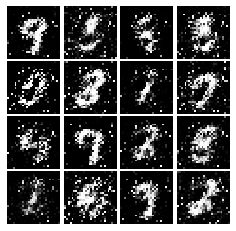

Epoch: 3, Iter: 1480, D: 1.056, G:1.18


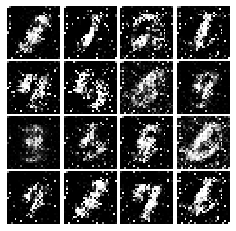

Epoch: 3, Iter: 1500, D: 1.073, G:1.146


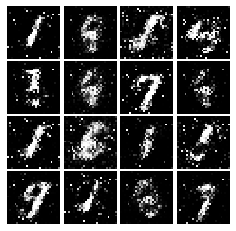

Epoch: 3, Iter: 1520, D: 1.197, G:1.024


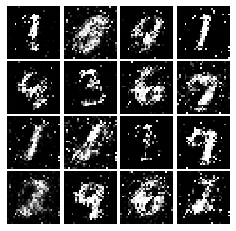

Epoch: 3, Iter: 1540, D: 1.161, G:1.494


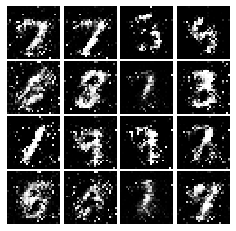

Epoch: 3, Iter: 1560, D: 0.9779, G:1.445


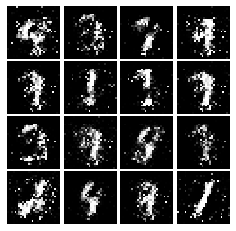

Epoch: 3, Iter: 1580, D: 1.049, G:1.243


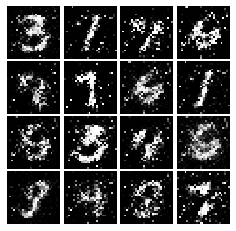

Epoch: 3, Iter: 1600, D: 1.201, G:1.148


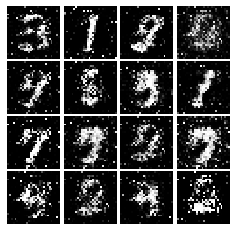

Epoch: 3, Iter: 1620, D: 0.9031, G:1.255


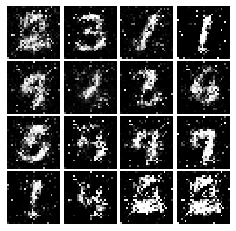

Epoch: 3, Iter: 1640, D: 1.26, G:1.371


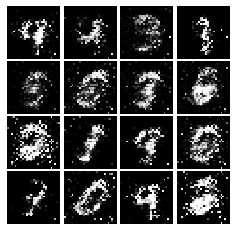

Epoch: 3, Iter: 1660, D: 0.9829, G:1.414


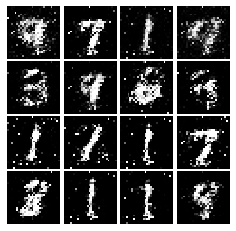

Epoch: 3, Iter: 1680, D: 1.272, G:1.126


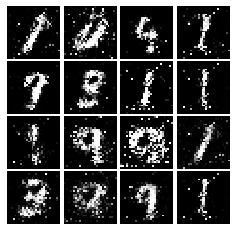

Epoch: 3, Iter: 1700, D: 1.111, G:1.191


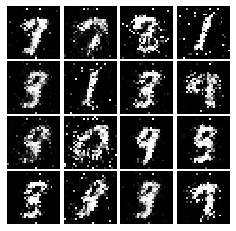

Epoch: 3, Iter: 1720, D: 1.088, G:1.167


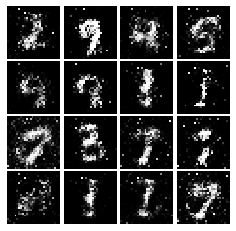

Epoch: 3, Iter: 1740, D: 0.9627, G:1.126


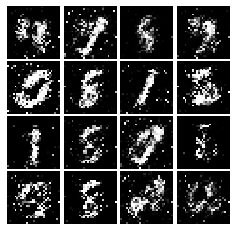

Epoch: 3, Iter: 1760, D: 0.9488, G:1.262


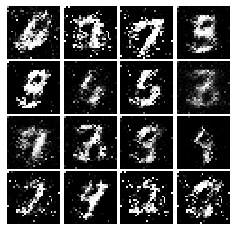

Epoch: 3, Iter: 1780, D: 0.9584, G:1.244


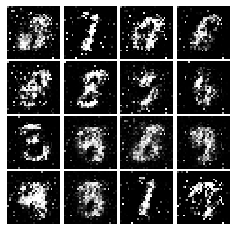

Epoch: 3, Iter: 1800, D: 1.288, G:1.096


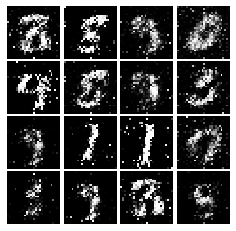

Epoch: 3, Iter: 1820, D: 1.044, G:1.214


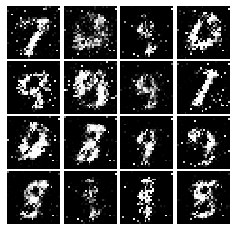

Epoch: 3, Iter: 1840, D: 0.9933, G:1.28


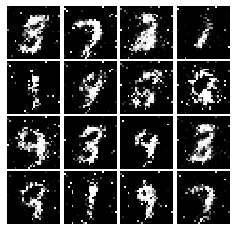

Epoch: 3, Iter: 1860, D: 1.174, G:1.117


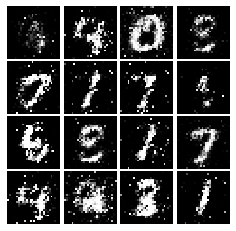

Epoch: 4, Iter: 1880, D: 0.9582, G:2.257


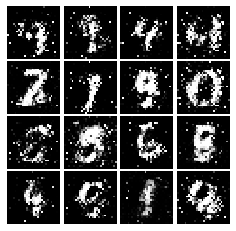

Epoch: 4, Iter: 1900, D: 1.149, G:1.671


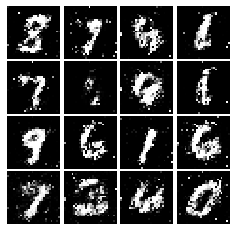

Epoch: 4, Iter: 1920, D: 1.084, G:1.467


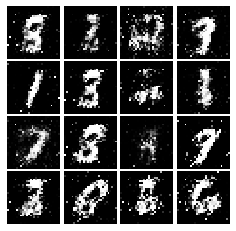

Epoch: 4, Iter: 1940, D: 1.078, G:1.057


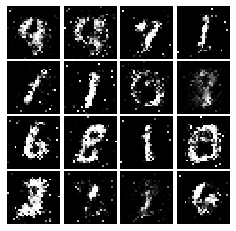

Epoch: 4, Iter: 1960, D: 0.9907, G:1.164


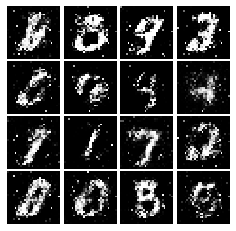

Epoch: 4, Iter: 1980, D: 1.116, G:1.408


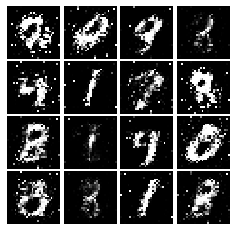

Epoch: 4, Iter: 2000, D: 1.047, G:1.124


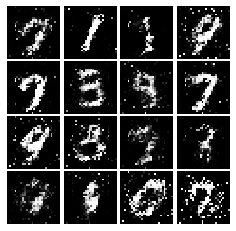

Epoch: 4, Iter: 2020, D: 1.097, G:1.169


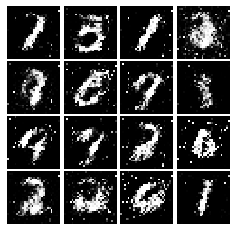

Epoch: 4, Iter: 2040, D: 1.068, G:1.141


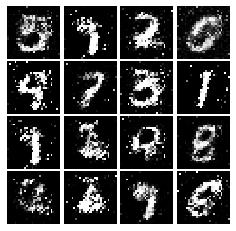

Epoch: 4, Iter: 2060, D: 1.027, G:1.212


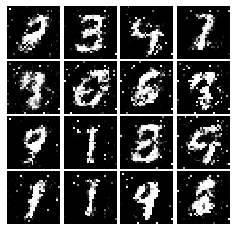

Epoch: 4, Iter: 2080, D: 1.062, G:1.475


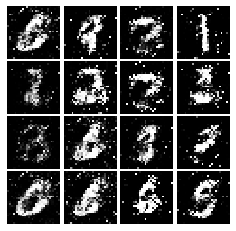

Epoch: 4, Iter: 2100, D: 1.102, G:1.438


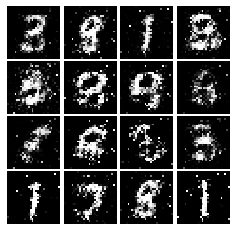

Epoch: 4, Iter: 2120, D: 1.171, G:1.07


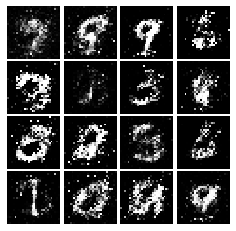

Epoch: 4, Iter: 2140, D: 1.121, G:1.087


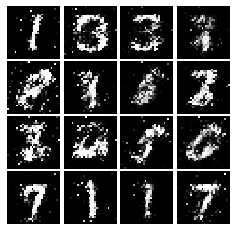

Epoch: 4, Iter: 2160, D: 1.217, G:1.054


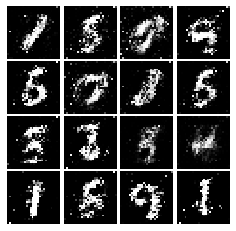

Epoch: 4, Iter: 2180, D: 0.9838, G:1.132


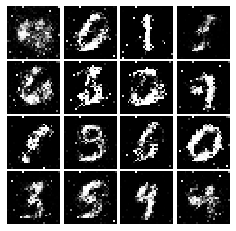

Epoch: 4, Iter: 2200, D: 1.067, G:1.121


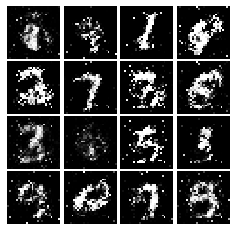

Epoch: 4, Iter: 2220, D: 1.21, G:0.4778


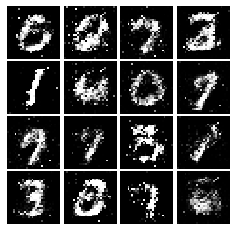

Epoch: 4, Iter: 2240, D: 1.048, G:1.253


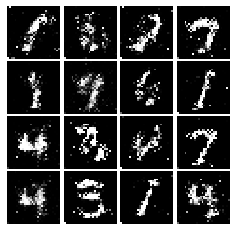

Epoch: 4, Iter: 2260, D: 1.175, G:1.008


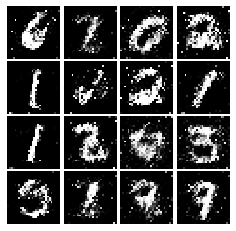

Epoch: 4, Iter: 2280, D: 1.201, G:0.8199


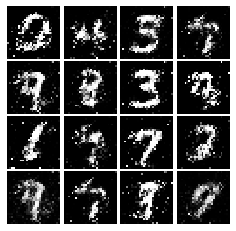

Epoch: 4, Iter: 2300, D: 1.074, G:1.127


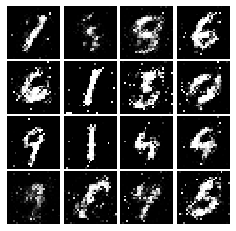

Epoch: 4, Iter: 2320, D: 1.075, G:1.026


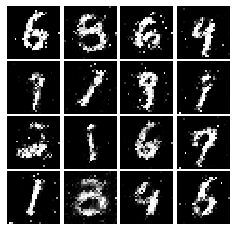

Epoch: 4, Iter: 2340, D: 0.7784, G:1.195


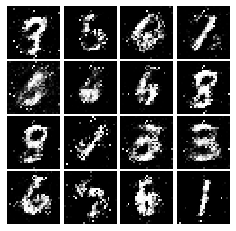

Epoch: 5, Iter: 2360, D: 1.149, G:0.9724


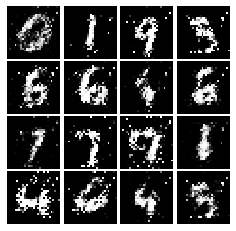

Epoch: 5, Iter: 2380, D: 1.012, G:1.229


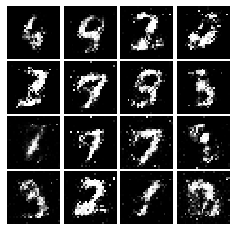

Epoch: 5, Iter: 2400, D: 1.202, G:0.7027


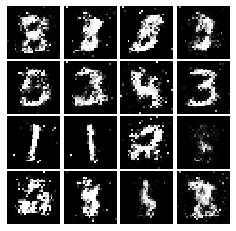

Epoch: 5, Iter: 2420, D: 1.088, G:0.9901


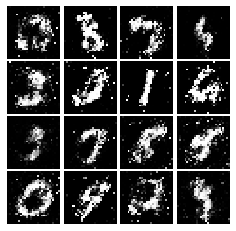

Epoch: 5, Iter: 2440, D: 1.286, G:0.6054


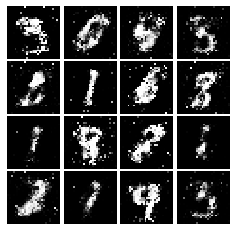

Epoch: 5, Iter: 2460, D: 1.034, G:1.33


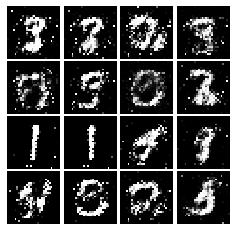

Epoch: 5, Iter: 2480, D: 1.077, G:0.5923


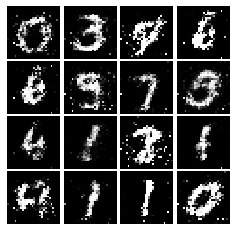

Epoch: 5, Iter: 2500, D: 1.148, G:1.047


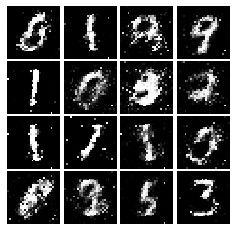

Epoch: 5, Iter: 2520, D: 1.339, G:1.08


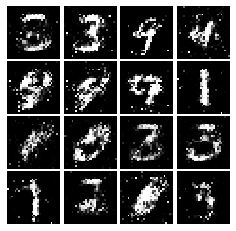

Epoch: 5, Iter: 2540, D: 1.189, G:1.178


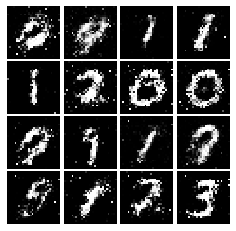

Epoch: 5, Iter: 2560, D: 1.321, G:1.126


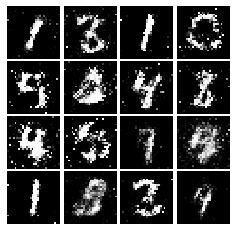

Epoch: 5, Iter: 2580, D: 1.159, G:1.083


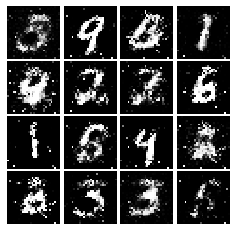

Epoch: 5, Iter: 2600, D: 1.369, G:0.9587


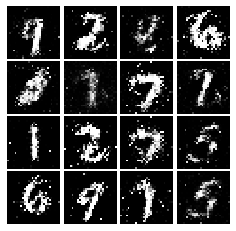

Epoch: 5, Iter: 2620, D: 1.147, G:1.074


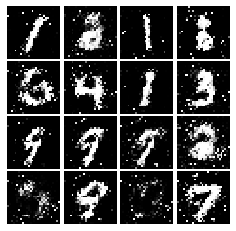

Epoch: 5, Iter: 2640, D: 1.144, G:1.1


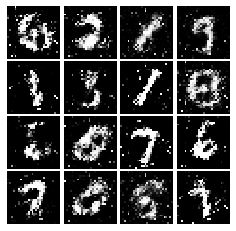

Epoch: 5, Iter: 2660, D: 1.142, G:1.006


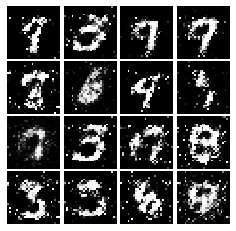

Epoch: 5, Iter: 2680, D: 1.295, G:0.8682


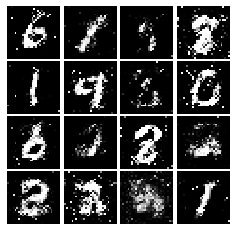

Epoch: 5, Iter: 2700, D: 1.291, G:1.052


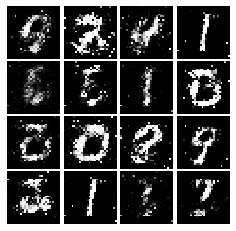

Epoch: 5, Iter: 2720, D: 1.156, G:1.084


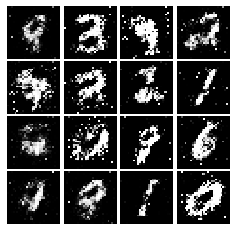

Epoch: 5, Iter: 2740, D: 1.234, G:1.083


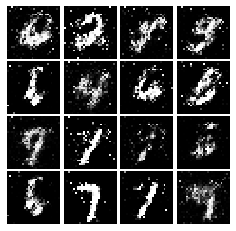

Epoch: 5, Iter: 2760, D: 1.213, G:1.17


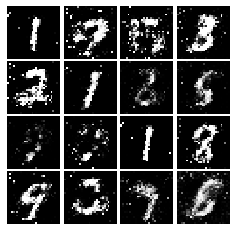

Epoch: 5, Iter: 2780, D: 1.066, G:1.202


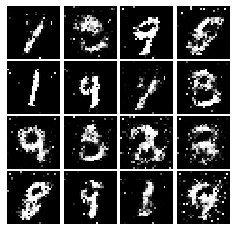

Epoch: 5, Iter: 2800, D: 1.002, G:1.205


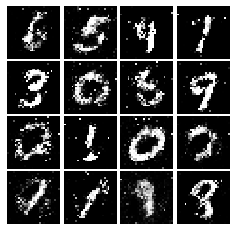

Epoch: 6, Iter: 2820, D: 1.064, G:1.159


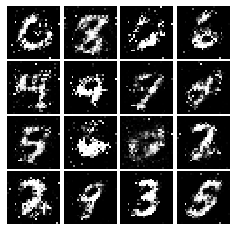

Epoch: 6, Iter: 2840, D: 1.204, G:0.9192


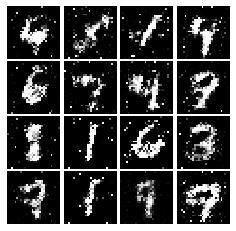

Epoch: 6, Iter: 2860, D: 1.071, G:1.225


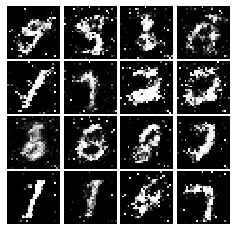

Epoch: 6, Iter: 2880, D: 1.22, G:0.9067


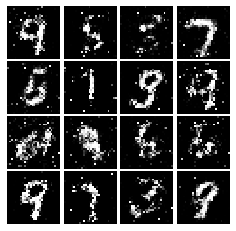

Epoch: 6, Iter: 2900, D: 1.198, G:1.042


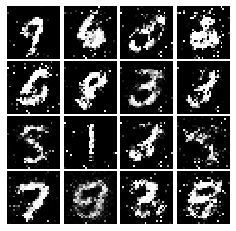

Epoch: 6, Iter: 2920, D: 1.248, G:0.9608


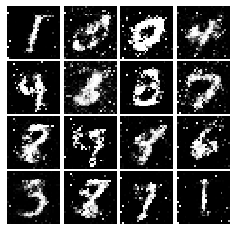

Epoch: 6, Iter: 2940, D: 1.173, G:0.9618


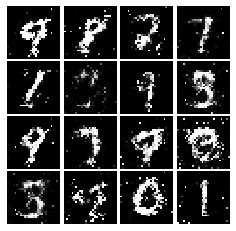

Epoch: 6, Iter: 2960, D: 1.146, G:1.11


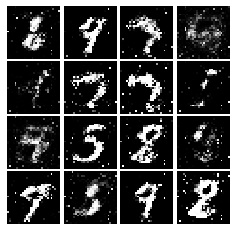

Epoch: 6, Iter: 2980, D: 1.207, G:0.9333


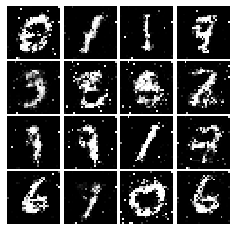

Epoch: 6, Iter: 3000, D: 1.277, G:1.047


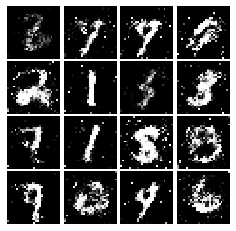

Epoch: 6, Iter: 3020, D: 1.154, G:1.252


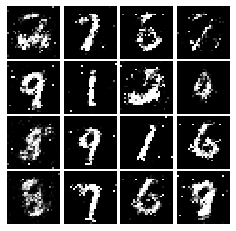

Epoch: 6, Iter: 3040, D: 0.9995, G:1.132


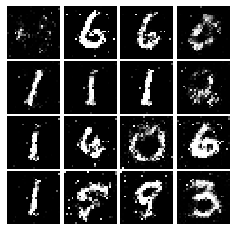

Epoch: 6, Iter: 3060, D: 1.191, G:0.8736


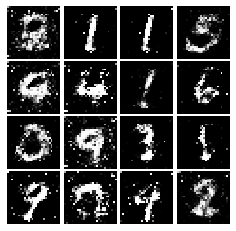

Epoch: 6, Iter: 3080, D: 1.249, G:1.057


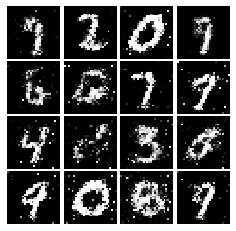

Epoch: 6, Iter: 3100, D: 1.078, G:1.227


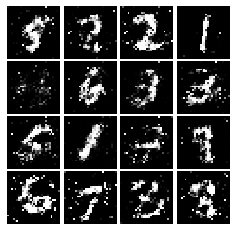

Epoch: 6, Iter: 3120, D: 1.161, G:0.9812


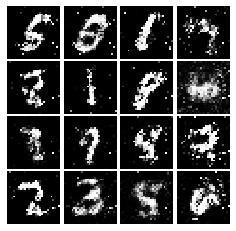

Epoch: 6, Iter: 3140, D: 1.289, G:0.9163


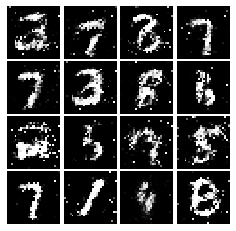

Epoch: 6, Iter: 3160, D: 1.208, G:1.09


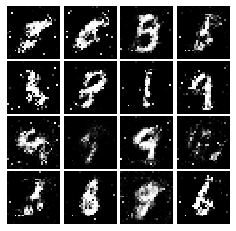

Epoch: 6, Iter: 3180, D: 1.22, G:1.069


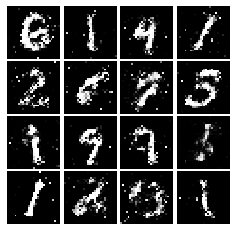

Epoch: 6, Iter: 3200, D: 1.19, G:0.9659


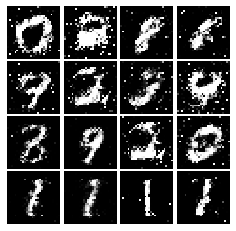

Epoch: 6, Iter: 3220, D: 1.244, G:0.976


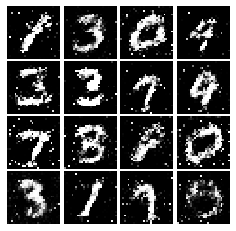

Epoch: 6, Iter: 3240, D: 1.122, G:1.044


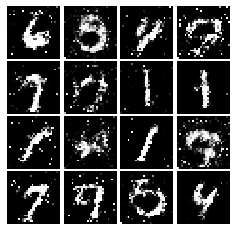

Epoch: 6, Iter: 3260, D: 1.263, G:0.9611


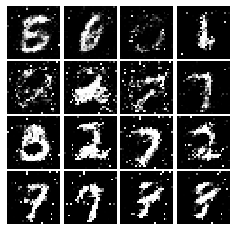

Epoch: 6, Iter: 3280, D: 1.174, G:0.898


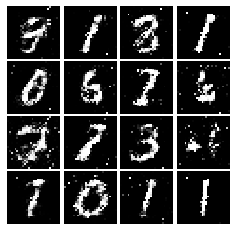

Epoch: 7, Iter: 3300, D: 1.117, G:1.088


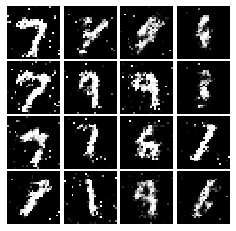

Epoch: 7, Iter: 3320, D: 1.145, G:1.144


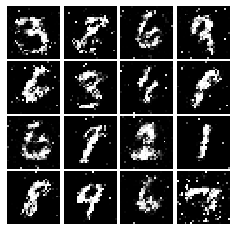

Epoch: 7, Iter: 3340, D: 1.159, G:1.04


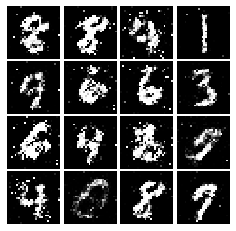

Epoch: 7, Iter: 3360, D: 1.269, G:0.9161


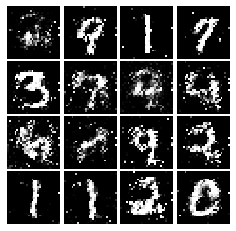

Epoch: 7, Iter: 3380, D: 1.22, G:0.9581


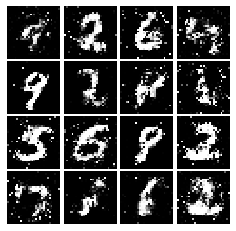

Epoch: 7, Iter: 3400, D: 1.396, G:0.9763


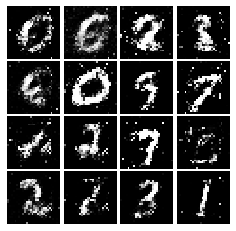

Epoch: 7, Iter: 3420, D: 1.275, G:1.036


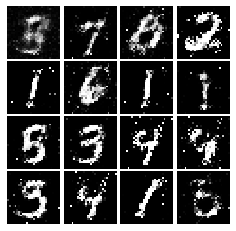

Epoch: 7, Iter: 3440, D: 1.145, G:1.045


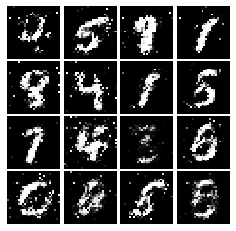

Epoch: 7, Iter: 3460, D: 1.178, G:1.198


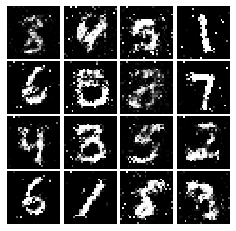

Epoch: 7, Iter: 3480, D: 1.174, G:0.9402


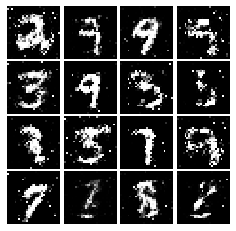

Epoch: 7, Iter: 3500, D: 1.326, G:1.06


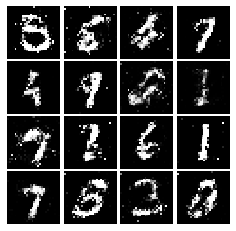

Epoch: 7, Iter: 3520, D: 1.104, G:1.013


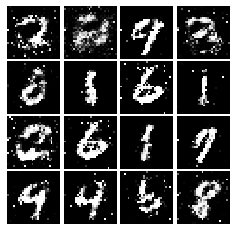

Epoch: 7, Iter: 3540, D: 1.089, G:1.089


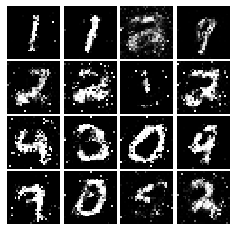

Epoch: 7, Iter: 3560, D: 1.111, G:0.9635


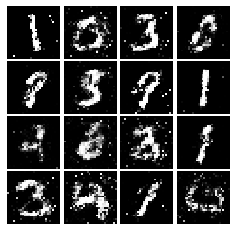

Epoch: 7, Iter: 3580, D: 1.213, G:0.9235


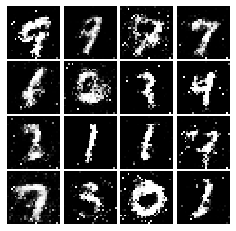

Epoch: 7, Iter: 3600, D: 1.281, G:0.935


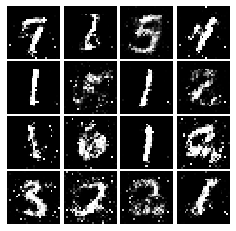

Epoch: 7, Iter: 3620, D: 1.253, G:1.025


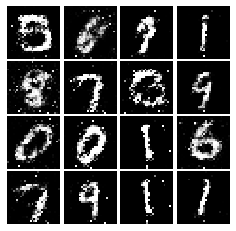

Epoch: 7, Iter: 3640, D: 1.309, G:0.5716


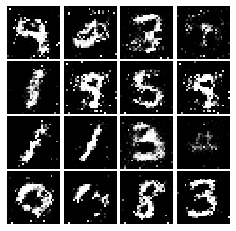

Epoch: 7, Iter: 3660, D: 1.146, G:0.9999


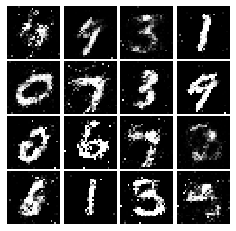

Epoch: 7, Iter: 3680, D: 1.189, G:0.9403


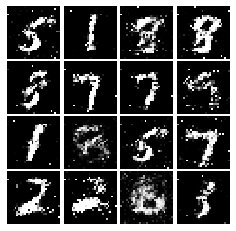

Epoch: 7, Iter: 3700, D: 1.201, G:1.06


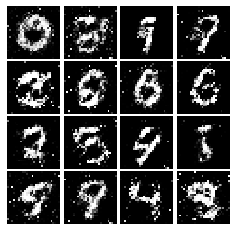

Epoch: 7, Iter: 3720, D: 1.21, G:0.9305


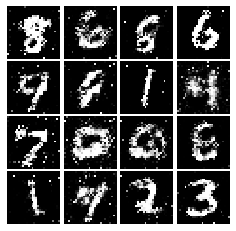

Epoch: 7, Iter: 3740, D: 1.331, G:0.7923


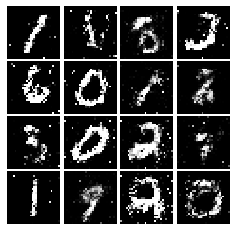

Epoch: 8, Iter: 3760, D: 1.268, G:1.017


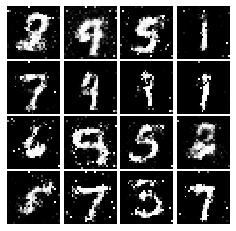

Epoch: 8, Iter: 3780, D: 1.207, G:0.9352


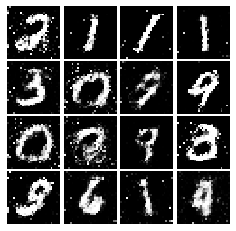

Epoch: 8, Iter: 3800, D: 1.113, G:1.011


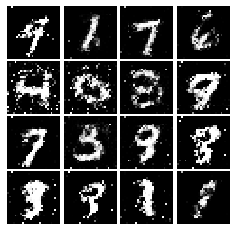

Epoch: 8, Iter: 3820, D: 1.07, G:0.9779


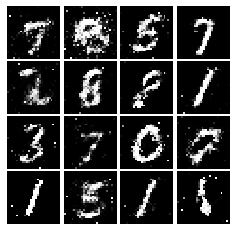

Epoch: 8, Iter: 3840, D: 1.241, G:0.989


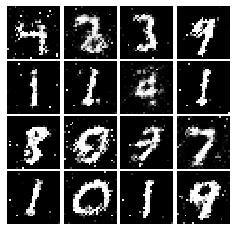

Epoch: 8, Iter: 3860, D: 1.206, G:1.208


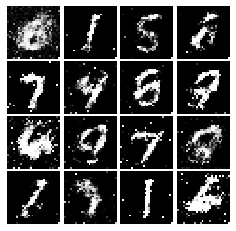

Epoch: 8, Iter: 3880, D: 1.173, G:1.109


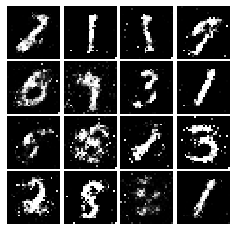

Epoch: 8, Iter: 3900, D: 1.305, G:0.9735


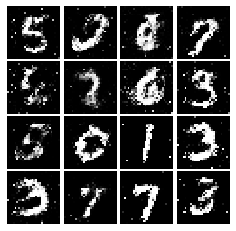

Epoch: 8, Iter: 3920, D: 0.9785, G:1.116


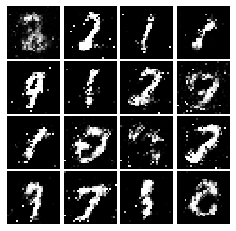

Epoch: 8, Iter: 3940, D: 1.304, G:0.9173


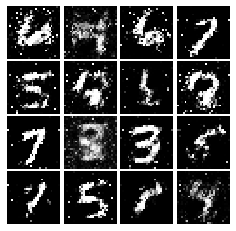

Epoch: 8, Iter: 3960, D: 1.236, G:0.8969


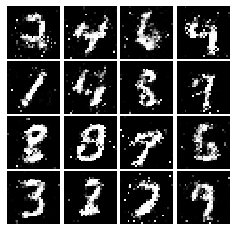

Epoch: 8, Iter: 3980, D: 1.272, G:1.047


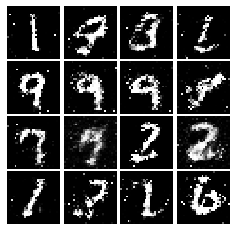

Epoch: 8, Iter: 4000, D: 1.19, G:1.012


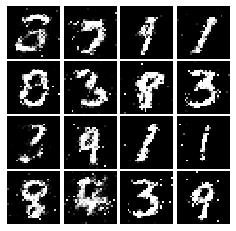

Epoch: 8, Iter: 4020, D: 1.24, G:0.933


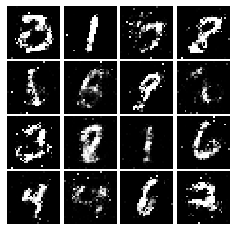

Epoch: 8, Iter: 4040, D: 1.213, G:1.059


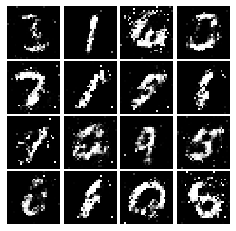

Epoch: 8, Iter: 4060, D: 1.104, G:0.9424


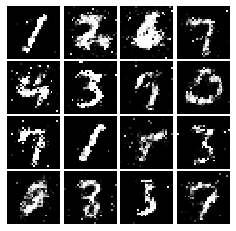

Epoch: 8, Iter: 4080, D: 1.196, G:1.048


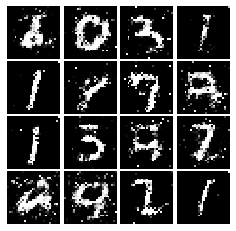

Epoch: 8, Iter: 4100, D: 1.166, G:1.021


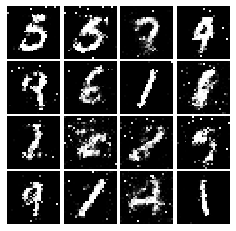

Epoch: 8, Iter: 4120, D: 1.123, G:1.022


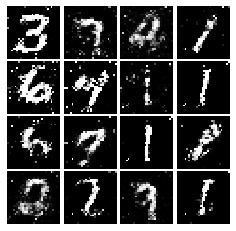

Epoch: 8, Iter: 4140, D: 1.126, G:1.178


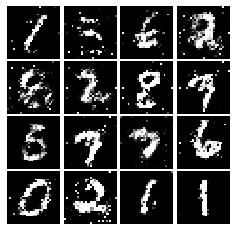

Epoch: 8, Iter: 4160, D: 1.308, G:1.057


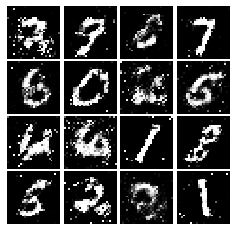

Epoch: 8, Iter: 4180, D: 1.143, G:0.8545


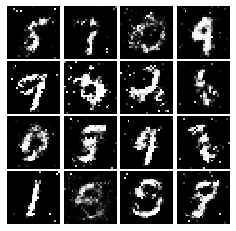

Epoch: 8, Iter: 4200, D: 1.176, G:1.038


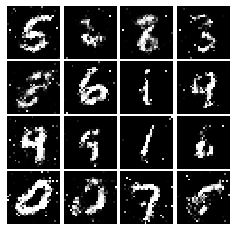

Epoch: 8, Iter: 4220, D: 1.074, G:1.174


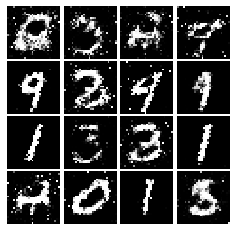

Epoch: 9, Iter: 4240, D: 1.136, G:0.9908


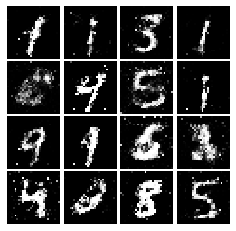

Epoch: 9, Iter: 4260, D: 1.272, G:0.9842


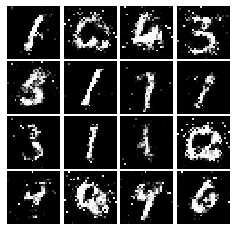

Epoch: 9, Iter: 4280, D: 1.122, G:1.087


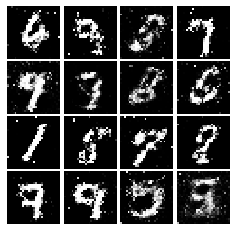

Epoch: 9, Iter: 4300, D: 1.257, G:0.8058


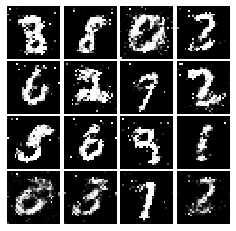

Epoch: 9, Iter: 4320, D: 1.339, G:1.048


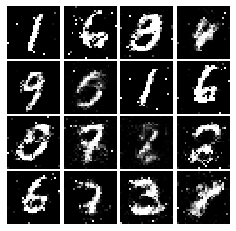

Epoch: 9, Iter: 4340, D: 1.24, G:1.023


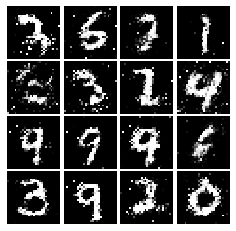

Epoch: 9, Iter: 4360, D: 1.176, G:0.8732


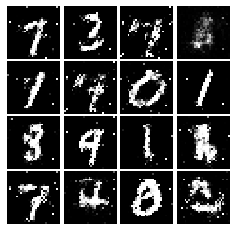

Epoch: 9, Iter: 4380, D: 1.231, G:0.8558


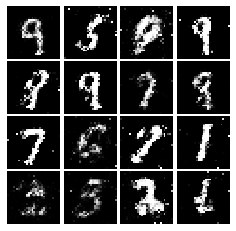

Epoch: 9, Iter: 4400, D: 1.157, G:0.9173


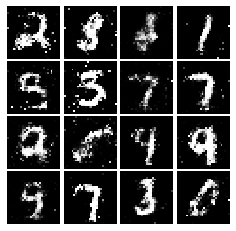

Epoch: 9, Iter: 4420, D: 1.196, G:0.986


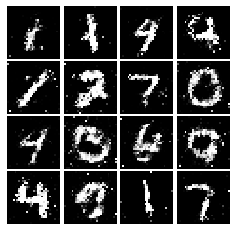

Epoch: 9, Iter: 4440, D: 1.158, G:0.8281


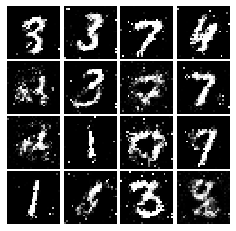

Epoch: 9, Iter: 4460, D: 1.395, G:1.066


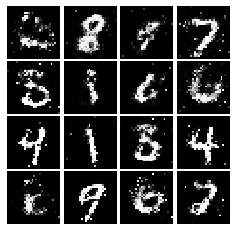

Epoch: 9, Iter: 4480, D: 1.199, G:0.8573


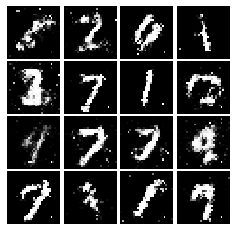

Epoch: 9, Iter: 4500, D: 1.329, G:0.8981


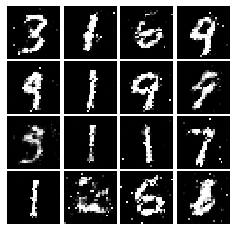

Epoch: 9, Iter: 4520, D: 1.25, G:1.262


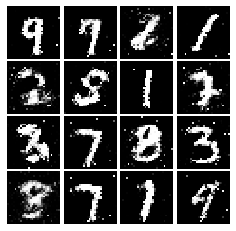

Epoch: 9, Iter: 4540, D: 1.135, G:1.08


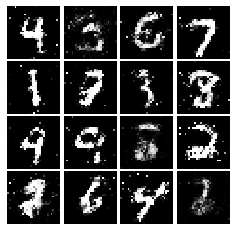

Epoch: 9, Iter: 4560, D: 1.116, G:0.9801


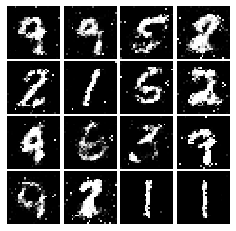

Epoch: 9, Iter: 4580, D: 1.151, G:0.8839


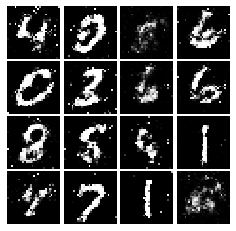

Epoch: 9, Iter: 4600, D: 1.283, G:0.9147


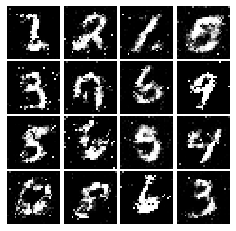

Epoch: 9, Iter: 4620, D: 1.171, G:0.9953


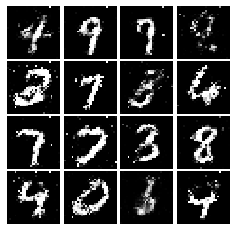

Epoch: 9, Iter: 4640, D: 1.23, G:0.9852


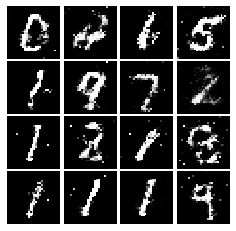

Epoch: 9, Iter: 4660, D: 1.286, G:0.9903


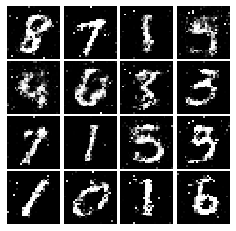

Epoch: 9, Iter: 4680, D: 1.196, G:0.98


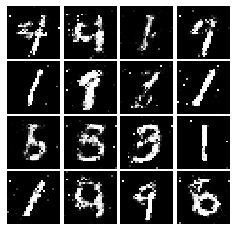

Final images


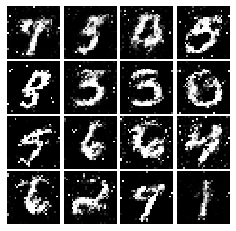

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [46]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = tf.reduce_mean(tf.square(scores_real - 1)) / 2 + tf.reduce_mean(tf.square(scores_fake)) / 2

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = tf.reduce_mean(tf.square(scores_fake - 1)) / 2

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [47]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.2192, G:0.5684


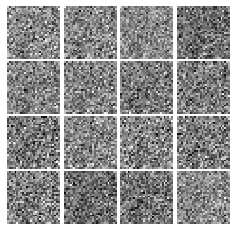

Epoch: 0, Iter: 20, D: 0.1462, G:0.9138


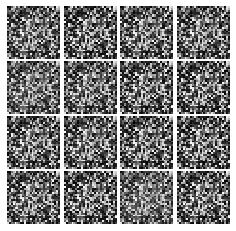

Epoch: 0, Iter: 40, D: 0.7272, G:0.3199


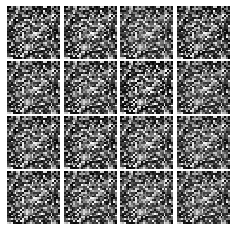

Epoch: 0, Iter: 60, D: 0.02042, G:0.4766


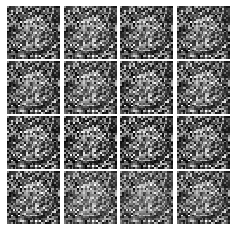

Epoch: 0, Iter: 80, D: 0.2693, G:0.7258


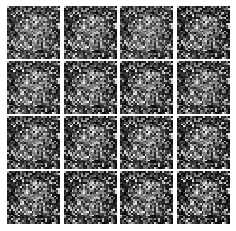

Epoch: 0, Iter: 100, D: 0.05349, G:0.9035


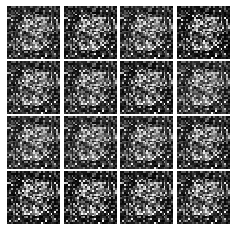

Epoch: 0, Iter: 120, D: 0.2678, G:1.022


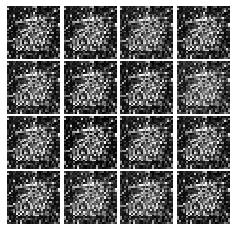

Epoch: 0, Iter: 140, D: 0.1022, G:0.5199


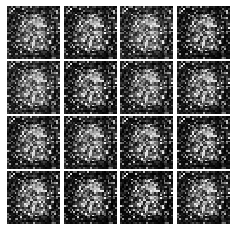

Epoch: 0, Iter: 160, D: 0.4442, G:0.5143


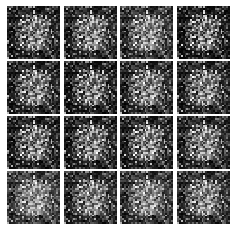

Epoch: 0, Iter: 180, D: 0.1273, G:0.3887


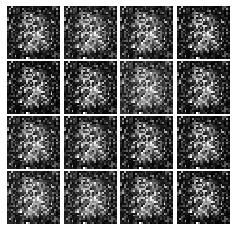

Epoch: 0, Iter: 200, D: 0.4817, G:0.2199


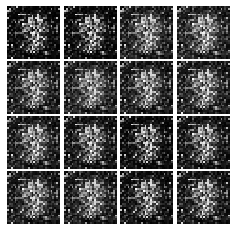

Epoch: 0, Iter: 220, D: 0.05857, G:0.6527


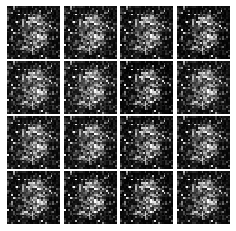

Epoch: 0, Iter: 240, D: 0.2512, G:0.188


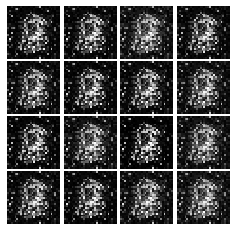

Epoch: 0, Iter: 260, D: 0.1178, G:0.2745


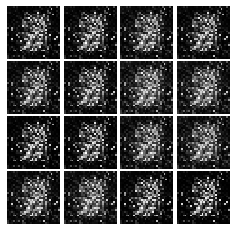

Epoch: 0, Iter: 280, D: 0.1331, G:0.4495


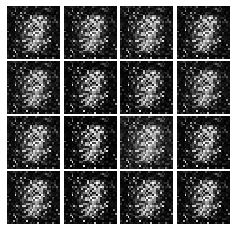

Epoch: 0, Iter: 300, D: 0.2118, G:0.289


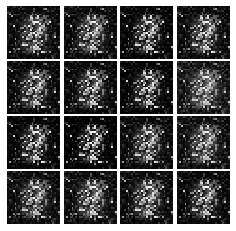

Epoch: 0, Iter: 320, D: 0.06596, G:0.4663


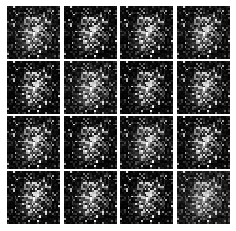

Epoch: 0, Iter: 340, D: 0.1429, G:0.394


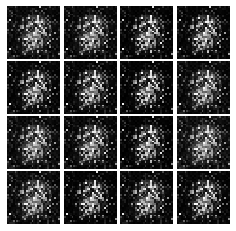

Epoch: 0, Iter: 360, D: 0.09073, G:0.472


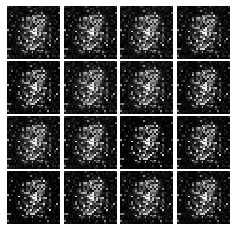

Epoch: 0, Iter: 380, D: 0.08354, G:0.5661


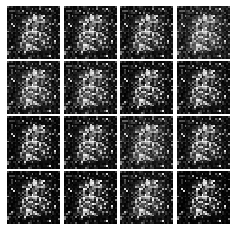

Epoch: 0, Iter: 400, D: 0.0508, G:0.4842


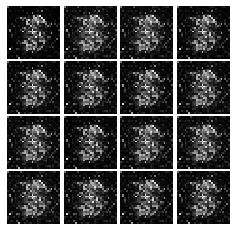

Epoch: 0, Iter: 420, D: 0.06223, G:0.4805


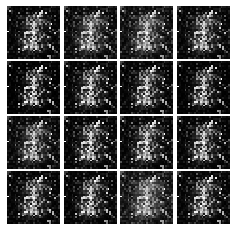

Epoch: 0, Iter: 440, D: 0.03343, G:0.6002


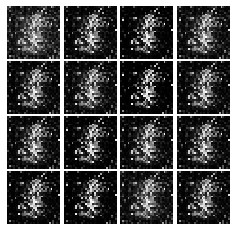

Epoch: 0, Iter: 460, D: 0.03093, G:0.6491


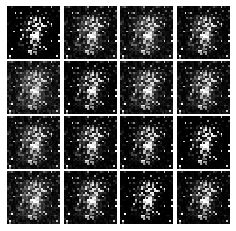

Epoch: 1, Iter: 480, D: 0.1623, G:0.263


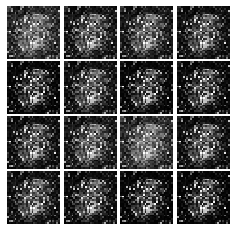

Epoch: 1, Iter: 500, D: 0.08804, G:0.4422


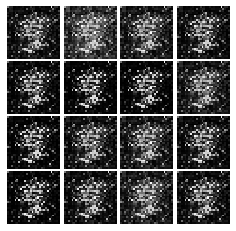

Epoch: 1, Iter: 520, D: 0.1497, G:0.6226


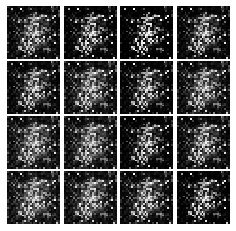

Epoch: 1, Iter: 540, D: 0.05926, G:0.7488


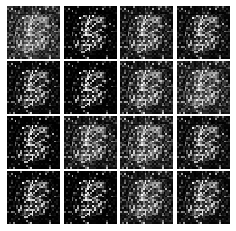

Epoch: 1, Iter: 560, D: 0.02724, G:0.627


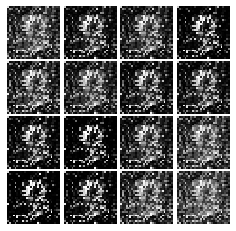

Epoch: 1, Iter: 580, D: 0.05357, G:0.5574


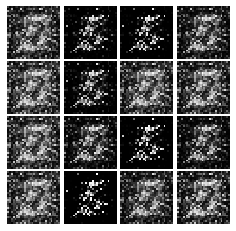

Epoch: 1, Iter: 600, D: 0.0671, G:0.5046


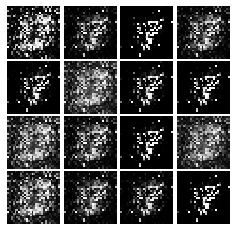

Epoch: 1, Iter: 620, D: 0.2676, G:0.1569


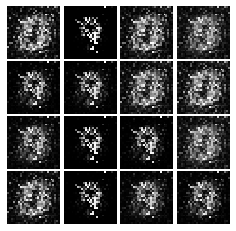

Epoch: 1, Iter: 640, D: 0.1374, G:0.3956


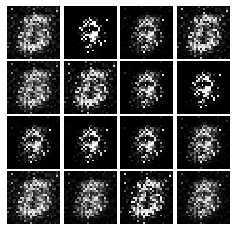

Epoch: 1, Iter: 660, D: 0.0899, G:0.5312


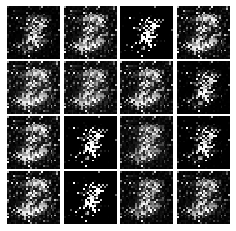

Epoch: 1, Iter: 680, D: 0.06464, G:0.499


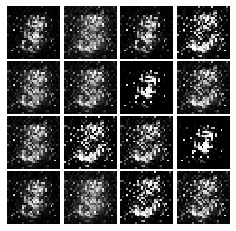

Epoch: 1, Iter: 700, D: 0.1523, G:0.186


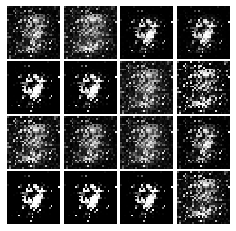

Epoch: 1, Iter: 720, D: 0.05366, G:0.5294


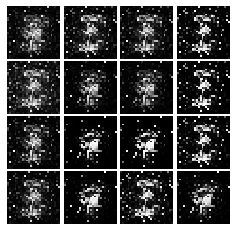

Epoch: 1, Iter: 740, D: 0.09111, G:0.542


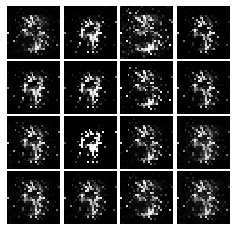

Epoch: 1, Iter: 760, D: 0.05128, G:0.5165


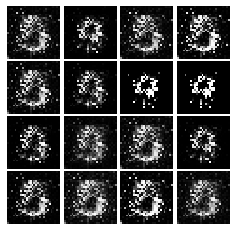

Epoch: 1, Iter: 780, D: 0.1327, G:0.423


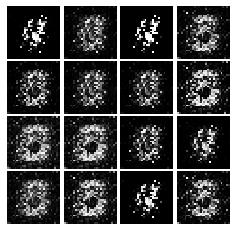

Epoch: 1, Iter: 800, D: 0.07307, G:0.4838


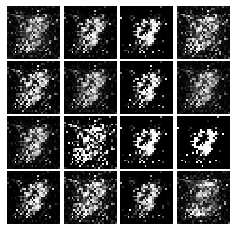

Epoch: 1, Iter: 820, D: 0.08506, G:0.4315


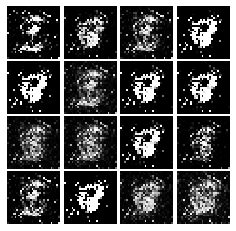

Epoch: 1, Iter: 840, D: 0.1087, G:0.495


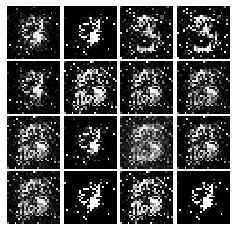

Epoch: 1, Iter: 860, D: 0.09163, G:0.3399


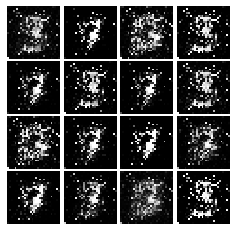

Epoch: 1, Iter: 880, D: 0.2387, G:0.2976


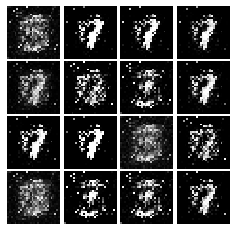

Epoch: 1, Iter: 900, D: 0.1444, G:0.3312


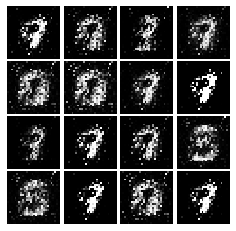

Epoch: 1, Iter: 920, D: 0.1375, G:0.1494


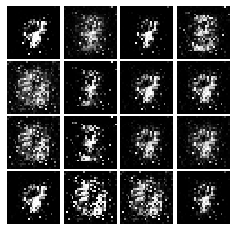

Epoch: 2, Iter: 940, D: 0.1211, G:0.3572


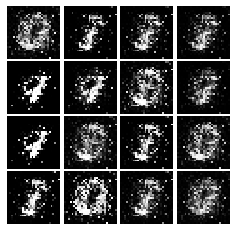

Epoch: 2, Iter: 960, D: 0.08358, G:0.366


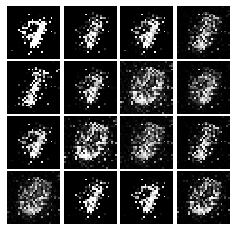

Epoch: 2, Iter: 980, D: 0.08664, G:0.4418


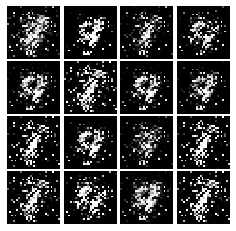

Epoch: 2, Iter: 1000, D: 0.1254, G:0.64


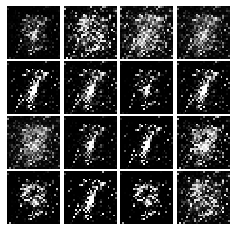

Epoch: 2, Iter: 1020, D: 0.1364, G:0.2656


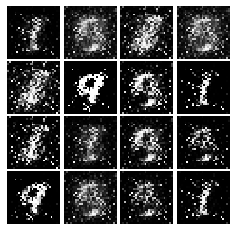

Epoch: 2, Iter: 1040, D: 0.1237, G:0.3874


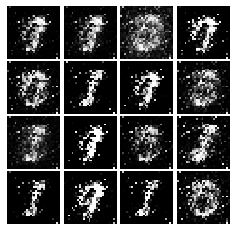

Epoch: 2, Iter: 1060, D: 0.1272, G:0.376


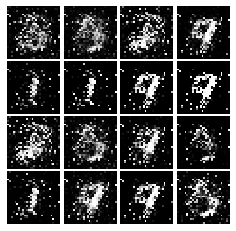

Epoch: 2, Iter: 1080, D: 0.09375, G:0.3364


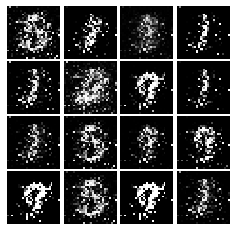

Epoch: 2, Iter: 1100, D: 0.08458, G:0.3453


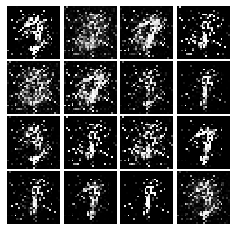

Epoch: 2, Iter: 1120, D: 0.1914, G:0.364


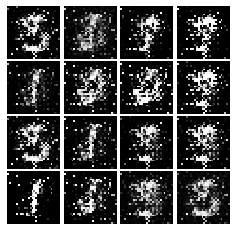

Epoch: 2, Iter: 1140, D: 0.1072, G:0.4171


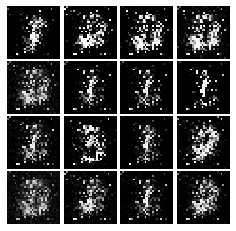

Epoch: 2, Iter: 1160, D: 0.188, G:0.2374


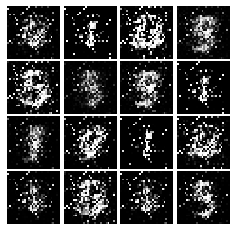

Epoch: 2, Iter: 1180, D: 0.2418, G:0.2808


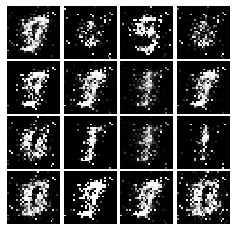

Epoch: 2, Iter: 1200, D: 0.1576, G:0.4088


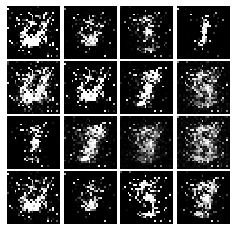

Epoch: 2, Iter: 1220, D: 0.07512, G:0.2999


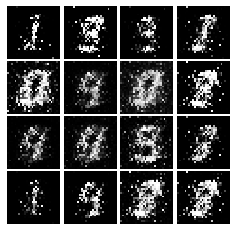

Epoch: 2, Iter: 1240, D: 0.1964, G:0.1863


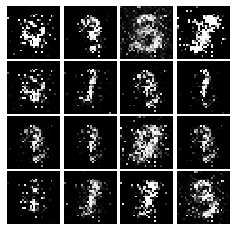

Epoch: 2, Iter: 1260, D: 0.1052, G:0.3437


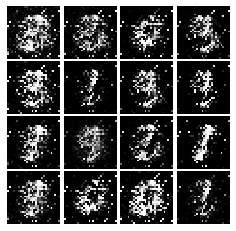

Epoch: 2, Iter: 1280, D: 0.1168, G:0.2056


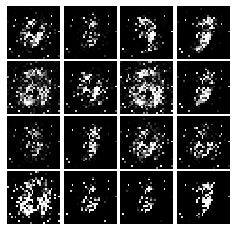

Epoch: 2, Iter: 1300, D: 0.1352, G:0.5924


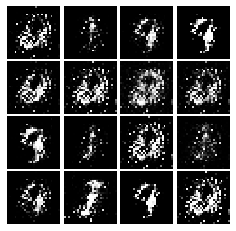

Epoch: 2, Iter: 1320, D: 0.1405, G:0.3046


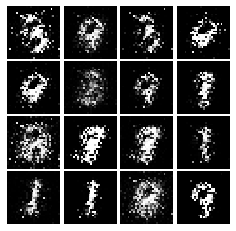

Epoch: 2, Iter: 1340, D: 0.1235, G:0.3375


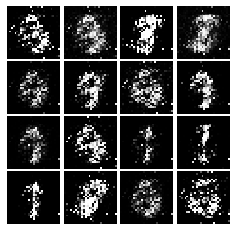

Epoch: 2, Iter: 1360, D: 0.1088, G:0.3234


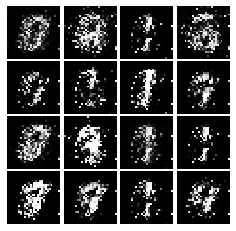

Epoch: 2, Iter: 1380, D: 0.1524, G:0.352


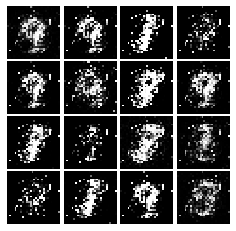

Epoch: 2, Iter: 1400, D: 0.1706, G:0.3137


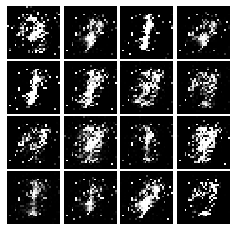

Epoch: 3, Iter: 1420, D: 0.1545, G:0.272


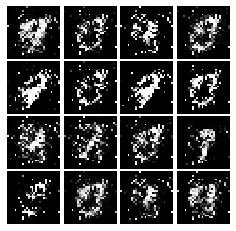

Epoch: 3, Iter: 1440, D: 0.1337, G:0.2828


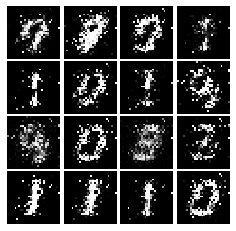

Epoch: 3, Iter: 1460, D: 0.145, G:0.3569


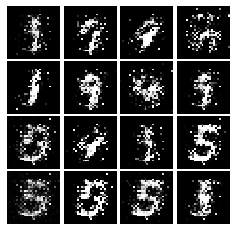

Epoch: 3, Iter: 1480, D: 0.1936, G:0.2201


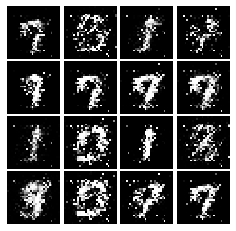

Epoch: 3, Iter: 1500, D: 0.1821, G:0.2664


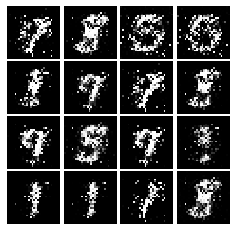

Epoch: 3, Iter: 1520, D: 0.1169, G:0.1957


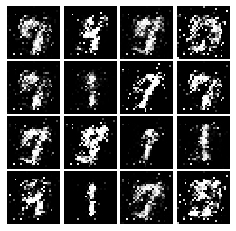

Epoch: 3, Iter: 1540, D: 0.1436, G:0.257


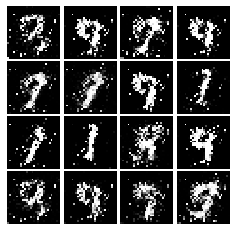

Epoch: 3, Iter: 1560, D: 0.1204, G:0.352


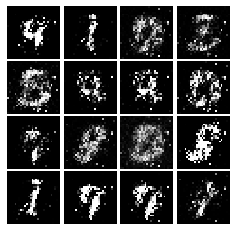

Epoch: 3, Iter: 1580, D: 0.1083, G:0.2893


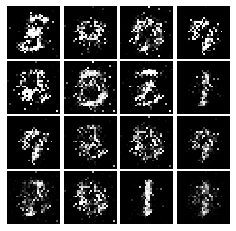

Epoch: 3, Iter: 1600, D: 0.1058, G:0.4176


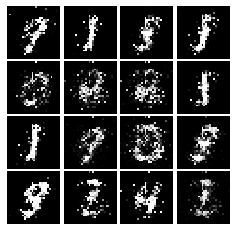

Epoch: 3, Iter: 1620, D: 0.1022, G:0.3298


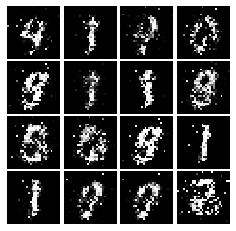

Epoch: 3, Iter: 1640, D: 0.1134, G:0.2259


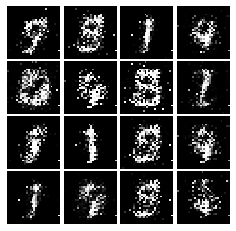

Epoch: 3, Iter: 1660, D: 0.1279, G:0.2919


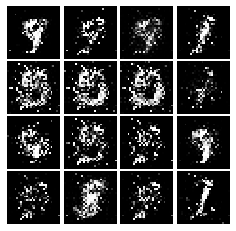

Epoch: 3, Iter: 1680, D: 0.1308, G:0.3363


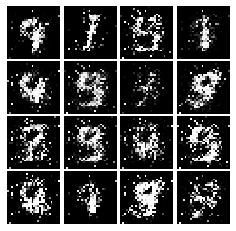

Epoch: 3, Iter: 1700, D: 0.1323, G:0.2808


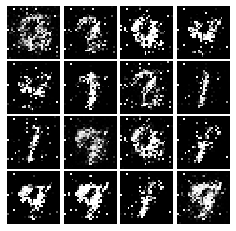

Epoch: 3, Iter: 1720, D: 0.1731, G:0.2783


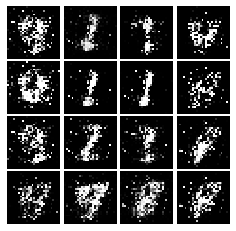

Epoch: 3, Iter: 1740, D: 0.114, G:0.316


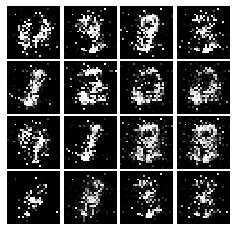

Epoch: 3, Iter: 1760, D: 0.1215, G:0.3382


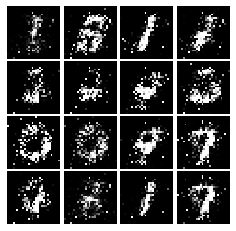

Epoch: 3, Iter: 1780, D: 0.1082, G:0.2877


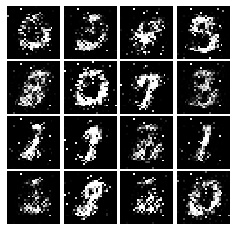

Epoch: 3, Iter: 1800, D: 0.1243, G:0.4353


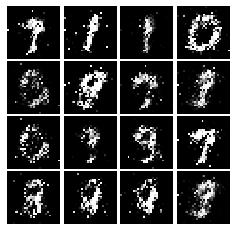

Epoch: 3, Iter: 1820, D: 0.1376, G:0.2629


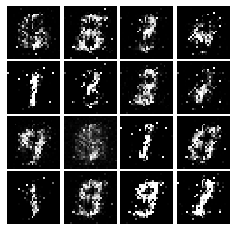

Epoch: 3, Iter: 1840, D: 0.1525, G:0.2633


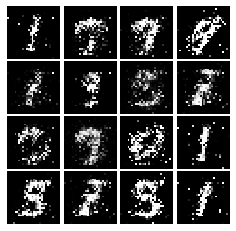

Epoch: 3, Iter: 1860, D: 0.1532, G:0.4187


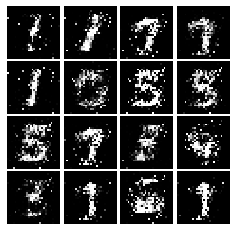

Epoch: 4, Iter: 1880, D: 0.1563, G:0.4359


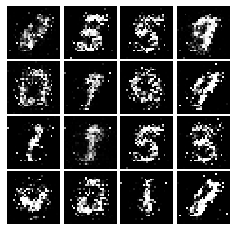

Epoch: 4, Iter: 1900, D: 0.157, G:0.2624


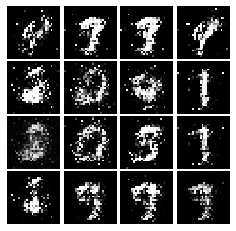

Epoch: 4, Iter: 1920, D: 0.1404, G:0.4574


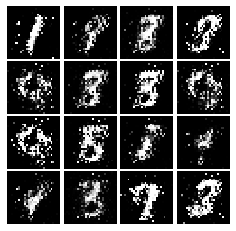

Epoch: 4, Iter: 1940, D: 0.1537, G:0.3259


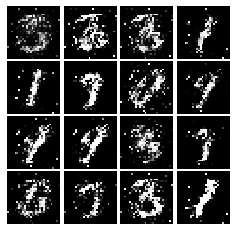

Epoch: 4, Iter: 1960, D: 0.1789, G:0.3619


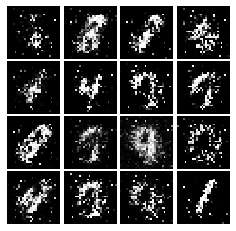

Epoch: 4, Iter: 1980, D: 0.1539, G:0.2615


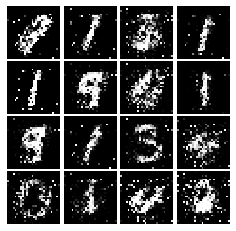

Epoch: 4, Iter: 2000, D: 0.1775, G:0.2914


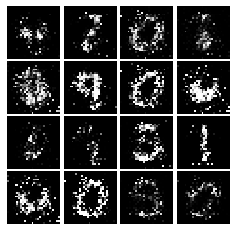

Epoch: 4, Iter: 2020, D: 0.1609, G:0.2633


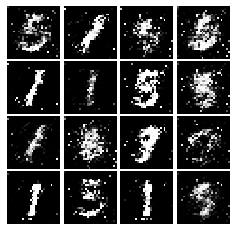

Epoch: 4, Iter: 2040, D: 0.18, G:0.2177


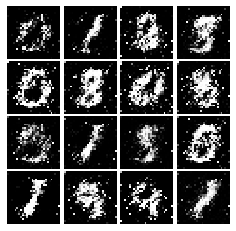

Epoch: 4, Iter: 2060, D: 0.1525, G:0.2918


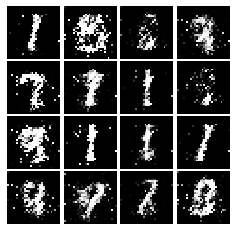

Epoch: 4, Iter: 2080, D: 0.1521, G:0.2654


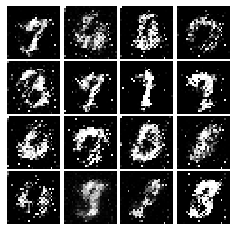

Epoch: 4, Iter: 2100, D: 0.1747, G:0.2155


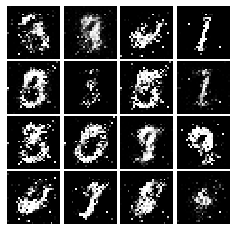

Epoch: 4, Iter: 2120, D: 0.1973, G:0.2198


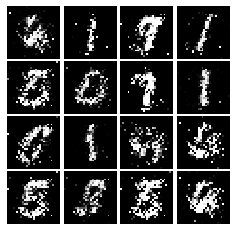

Epoch: 4, Iter: 2140, D: 0.1597, G:0.2697


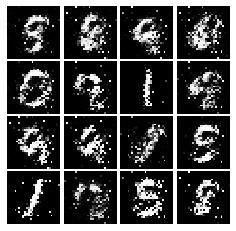

Epoch: 4, Iter: 2160, D: 0.1541, G:0.2484


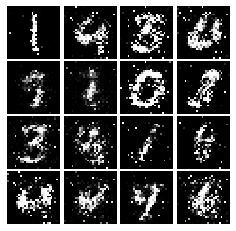

Epoch: 4, Iter: 2180, D: 0.1616, G:0.282


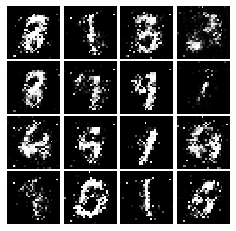

Epoch: 4, Iter: 2200, D: 0.1555, G:0.2134


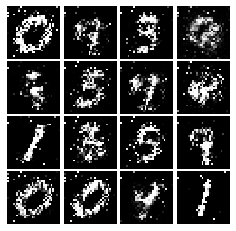

Epoch: 4, Iter: 2220, D: 0.2112, G:0.3544


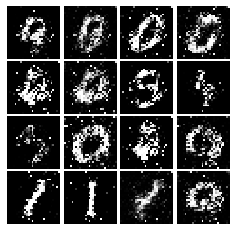

Epoch: 4, Iter: 2240, D: 0.1519, G:0.3386


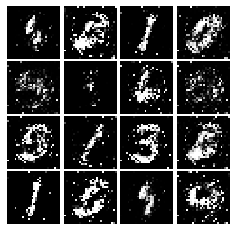

Epoch: 4, Iter: 2260, D: 0.1863, G:0.3139


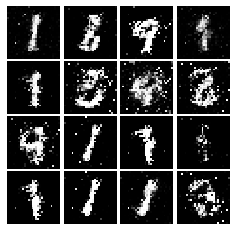

Epoch: 4, Iter: 2280, D: 0.1685, G:0.2364


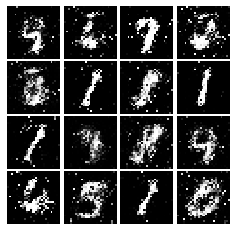

Epoch: 4, Iter: 2300, D: 0.1521, G:0.2454


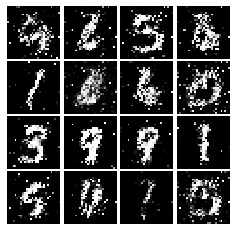

Epoch: 4, Iter: 2320, D: 0.1458, G:0.2682


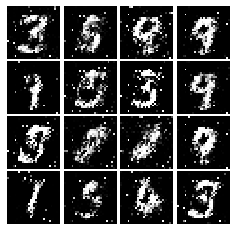

Epoch: 4, Iter: 2340, D: 0.1852, G:0.2669


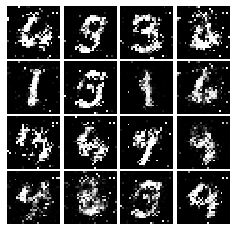

Epoch: 5, Iter: 2360, D: 0.1657, G:0.2157


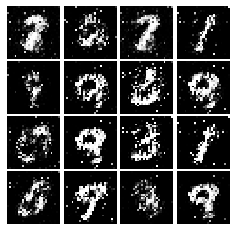

Epoch: 5, Iter: 2380, D: 0.1656, G:0.2418


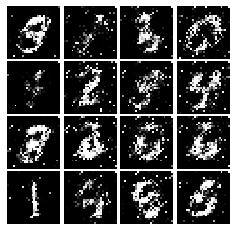

Epoch: 5, Iter: 2400, D: 0.2702, G:0.2217


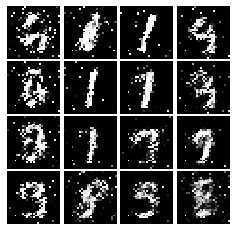

Epoch: 5, Iter: 2420, D: 0.1631, G:0.2297


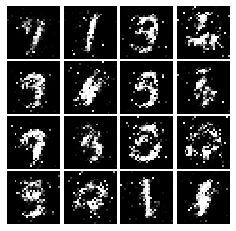

Epoch: 5, Iter: 2440, D: 0.1682, G:0.2461


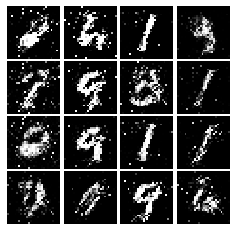

Epoch: 5, Iter: 2460, D: 0.1619, G:0.2504


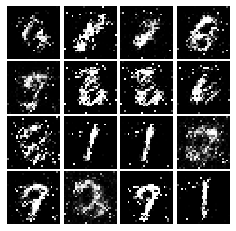

Epoch: 5, Iter: 2480, D: 0.1395, G:0.3365


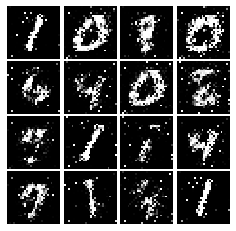

Epoch: 5, Iter: 2500, D: 0.154, G:0.2431


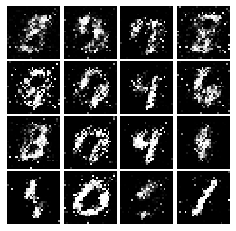

Epoch: 5, Iter: 2520, D: 0.2035, G:0.1866


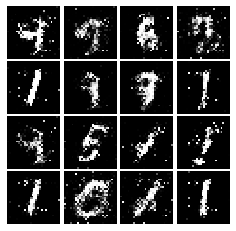

Epoch: 5, Iter: 2540, D: 0.2042, G:0.2249


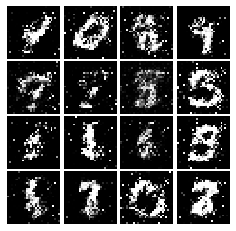

Epoch: 5, Iter: 2560, D: 0.1691, G:0.2608


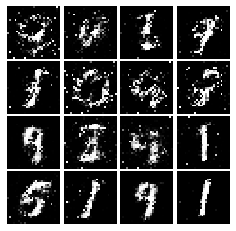

Epoch: 5, Iter: 2580, D: 0.1494, G:0.2147


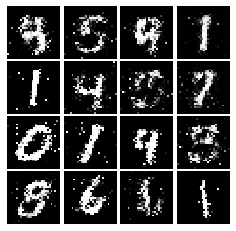

Epoch: 5, Iter: 2600, D: 0.3154, G:0.244


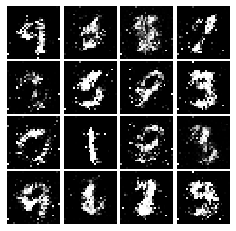

Epoch: 5, Iter: 2620, D: 0.2077, G:0.1959


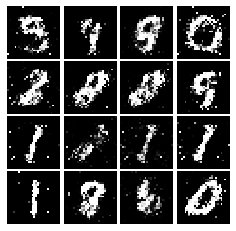

Epoch: 5, Iter: 2640, D: 0.2221, G:0.1915


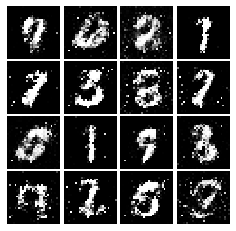

Epoch: 5, Iter: 2660, D: 0.1976, G:0.1894


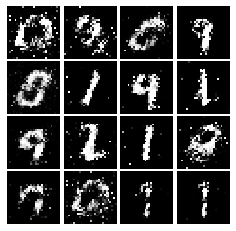

Epoch: 5, Iter: 2680, D: 0.2202, G:0.1678


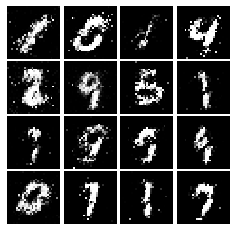

Epoch: 5, Iter: 2700, D: 0.2066, G:0.182


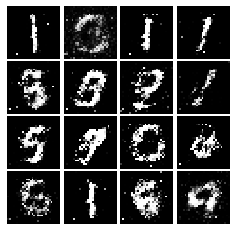

Epoch: 5, Iter: 2720, D: 0.1998, G:0.1911


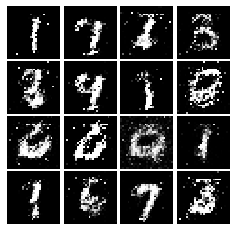

Epoch: 5, Iter: 2740, D: 0.229, G:0.1551


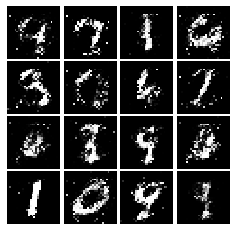

Epoch: 5, Iter: 2760, D: 0.1943, G:0.1847


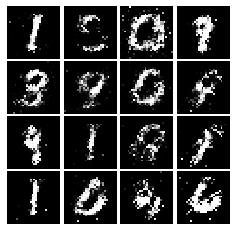

Epoch: 5, Iter: 2780, D: 0.1986, G:0.1468


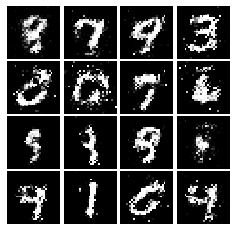

Epoch: 5, Iter: 2800, D: 0.1867, G:0.2307


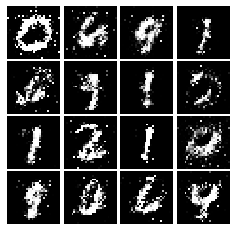

Epoch: 6, Iter: 2820, D: 0.172, G:0.2194


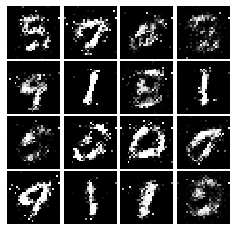

Epoch: 6, Iter: 2840, D: 0.1768, G:0.252


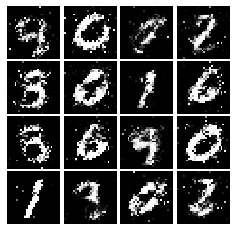

Epoch: 6, Iter: 2860, D: 0.1816, G:0.2596


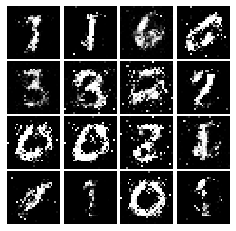

Epoch: 6, Iter: 2880, D: 0.1951, G:0.2473


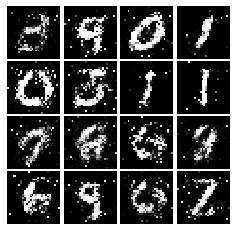

Epoch: 6, Iter: 2900, D: 0.1713, G:0.2274


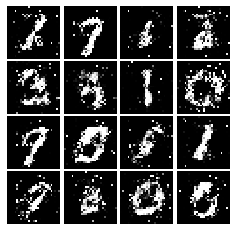

Epoch: 6, Iter: 2920, D: 0.2108, G:0.1585


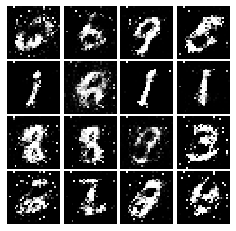

Epoch: 6, Iter: 2940, D: 0.1682, G:0.2585


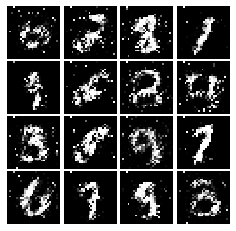

Epoch: 6, Iter: 2960, D: 0.1816, G:0.2367


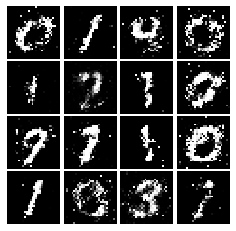

Epoch: 6, Iter: 2980, D: 0.1877, G:0.1896


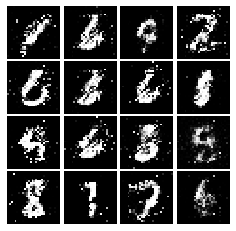

Epoch: 6, Iter: 3000, D: 0.2059, G:0.2297


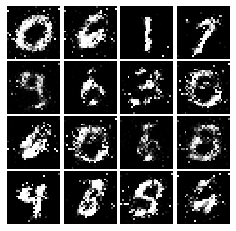

Epoch: 6, Iter: 3020, D: 0.1831, G:0.2049


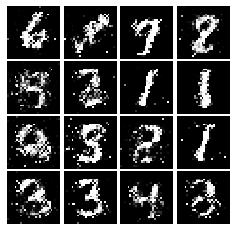

Epoch: 6, Iter: 3040, D: 0.1725, G:0.224


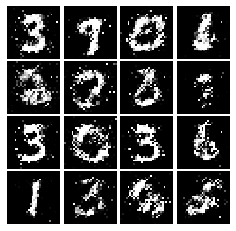

Epoch: 6, Iter: 3060, D: 0.1731, G:0.2112


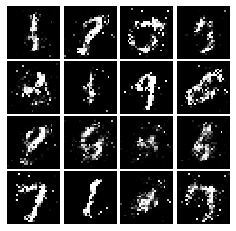

Epoch: 6, Iter: 3080, D: 0.1778, G:0.2501


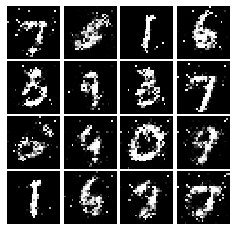

Epoch: 6, Iter: 3100, D: 0.1752, G:0.2546


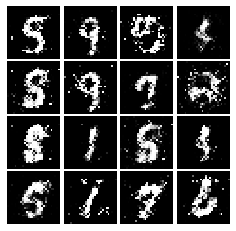

Epoch: 6, Iter: 3120, D: 0.1477, G:0.2066


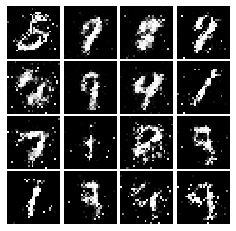

Epoch: 6, Iter: 3140, D: 0.1862, G:0.2276


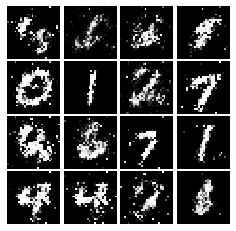

Epoch: 6, Iter: 3160, D: 0.1905, G:0.223


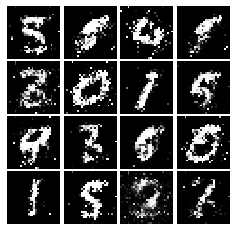

Epoch: 6, Iter: 3180, D: 0.7073, G:0.1105


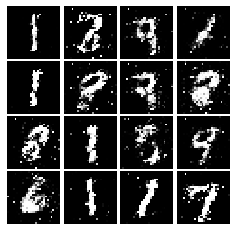

Epoch: 6, Iter: 3200, D: 0.207, G:0.2094


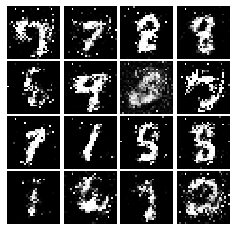

Epoch: 6, Iter: 3220, D: 0.1995, G:0.2077


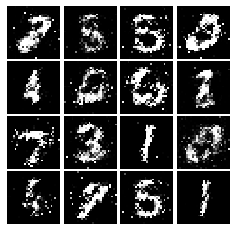

Epoch: 6, Iter: 3240, D: 0.2078, G:0.2243


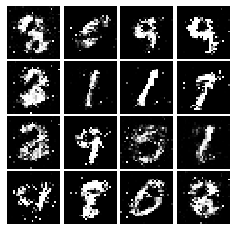

Epoch: 6, Iter: 3260, D: 0.2337, G:0.1662


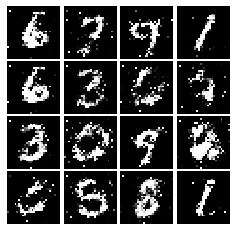

Epoch: 6, Iter: 3280, D: 0.2068, G:0.1639


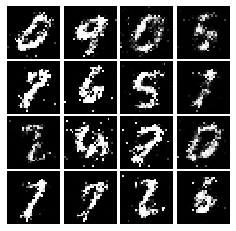

Epoch: 7, Iter: 3300, D: 0.1823, G:0.2527


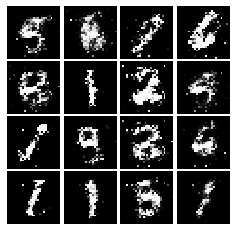

Epoch: 7, Iter: 3320, D: 0.1851, G:0.2101


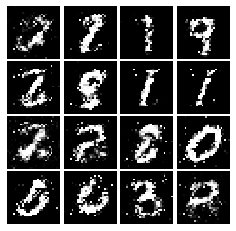

Epoch: 7, Iter: 3340, D: 0.1991, G:0.2453


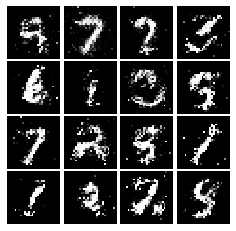

Epoch: 7, Iter: 3360, D: 0.2223, G:0.1944


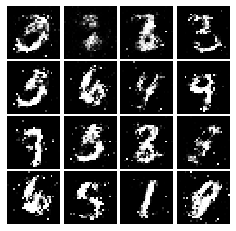

Epoch: 7, Iter: 3380, D: 0.2076, G:0.1931


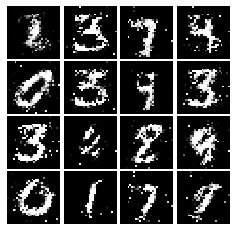

Epoch: 7, Iter: 3400, D: 0.2112, G:0.1922


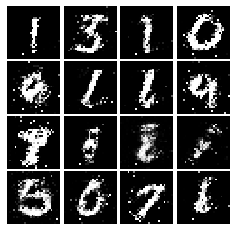

Epoch: 7, Iter: 3420, D: 0.1905, G:0.2487


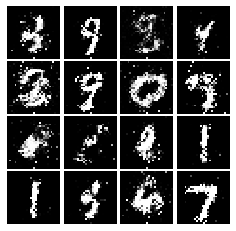

Epoch: 7, Iter: 3440, D: 0.1941, G:0.2226


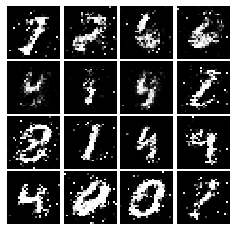

Epoch: 7, Iter: 3460, D: 0.186, G:0.2367


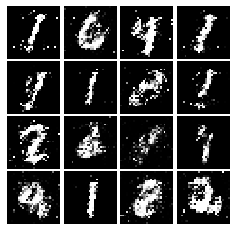

Epoch: 7, Iter: 3480, D: 0.2323, G:0.2383


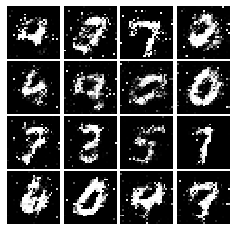

Epoch: 7, Iter: 3500, D: 0.252, G:0.1745


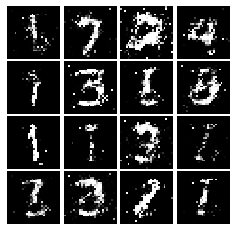

Epoch: 7, Iter: 3520, D: 0.185, G:0.2073


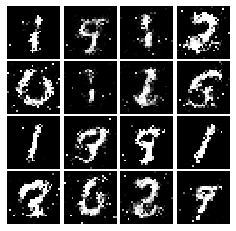

Epoch: 7, Iter: 3540, D: 0.1777, G:0.2219


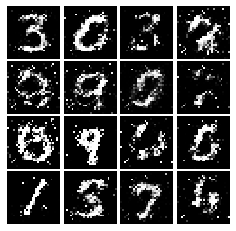

Epoch: 7, Iter: 3560, D: 0.1755, G:0.2006


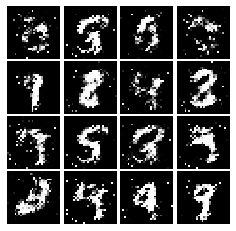

Epoch: 7, Iter: 3580, D: 0.1874, G:0.1854


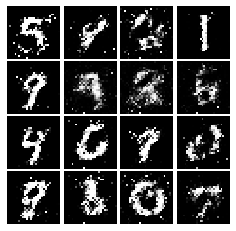

Epoch: 7, Iter: 3600, D: 0.1933, G:0.2087


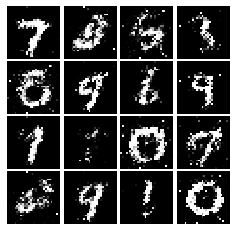

Epoch: 7, Iter: 3620, D: 0.2023, G:0.2225


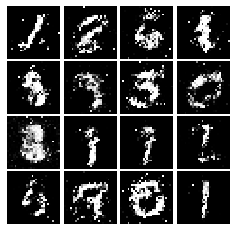

Epoch: 7, Iter: 3640, D: 0.218, G:0.2053


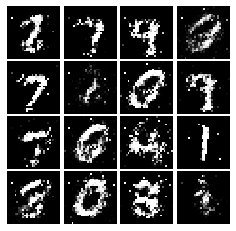

Epoch: 7, Iter: 3660, D: 0.2058, G:0.226


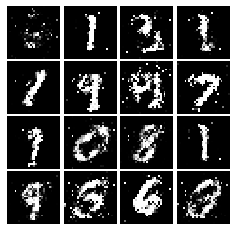

Epoch: 7, Iter: 3680, D: 0.2251, G:0.1752


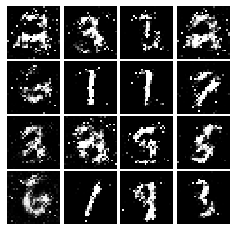

Epoch: 7, Iter: 3700, D: 0.2004, G:0.2113


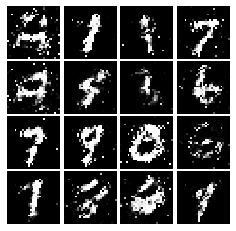

Epoch: 7, Iter: 3720, D: 0.1977, G:0.2234


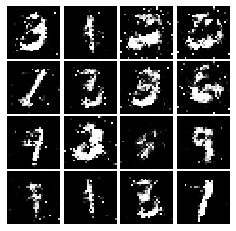

Epoch: 7, Iter: 3740, D: 0.2048, G:0.1871


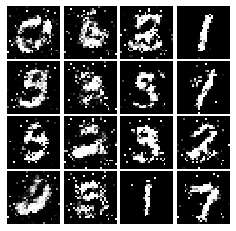

Epoch: 8, Iter: 3760, D: 0.2222, G:0.1993


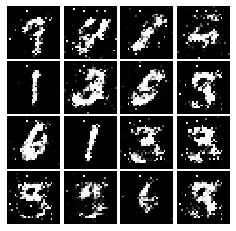

Epoch: 8, Iter: 3780, D: 0.2439, G:0.1989


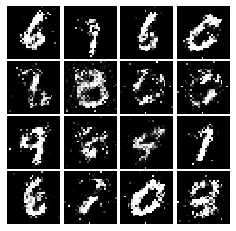

Epoch: 8, Iter: 3800, D: 0.2097, G:0.1919


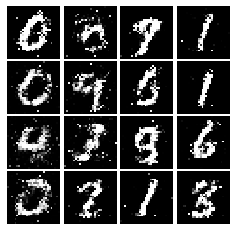

Epoch: 8, Iter: 3820, D: 0.2133, G:0.1785


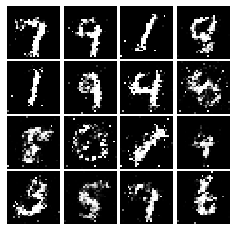

Epoch: 8, Iter: 3840, D: 0.2137, G:0.1977


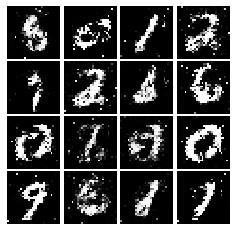

Epoch: 8, Iter: 3860, D: 0.1931, G:0.2074


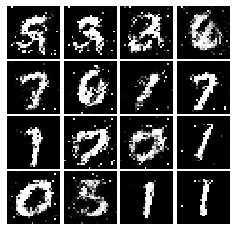

Epoch: 8, Iter: 3880, D: 0.2018, G:0.2061


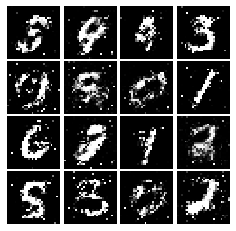

Epoch: 8, Iter: 3900, D: 0.2193, G:0.2125


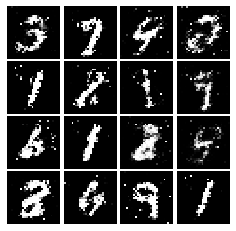

Epoch: 8, Iter: 3920, D: 0.177, G:0.2379


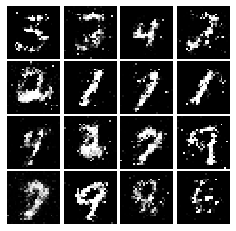

Epoch: 8, Iter: 3940, D: 0.1977, G:0.173


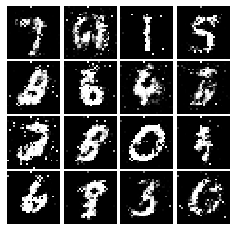

Epoch: 8, Iter: 3960, D: 0.2095, G:0.194


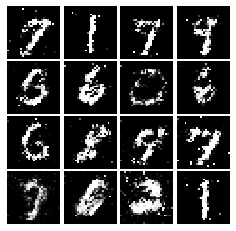

Epoch: 8, Iter: 3980, D: 0.1961, G:0.2244


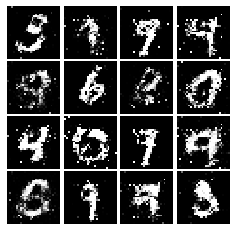

Epoch: 8, Iter: 4000, D: 0.1848, G:0.2313


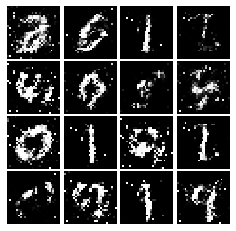

Epoch: 8, Iter: 4020, D: 0.2036, G:0.2188


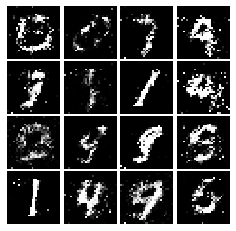

Epoch: 8, Iter: 4040, D: 0.2177, G:0.1877


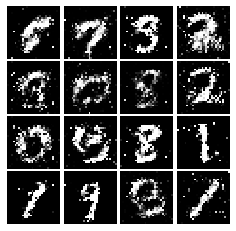

Epoch: 8, Iter: 4060, D: 0.2, G:0.1989


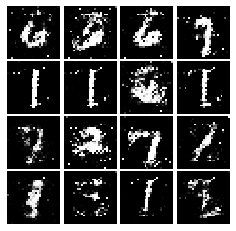

Epoch: 8, Iter: 4080, D: 0.2301, G:0.1779


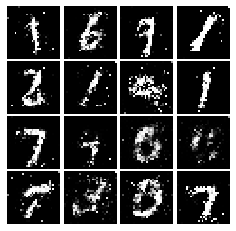

Epoch: 8, Iter: 4100, D: 0.2072, G:0.1962


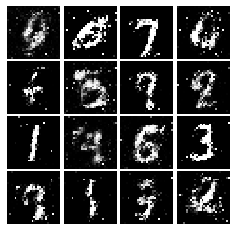

Epoch: 8, Iter: 4120, D: 0.2013, G:0.1931


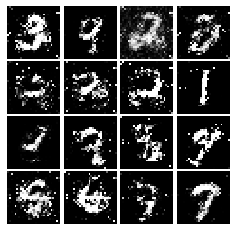

Epoch: 8, Iter: 4140, D: 0.189, G:0.2168


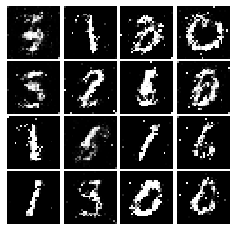

Epoch: 8, Iter: 4160, D: 0.2311, G:0.1913


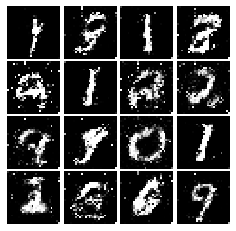

Epoch: 8, Iter: 4180, D: 0.2002, G:0.1779


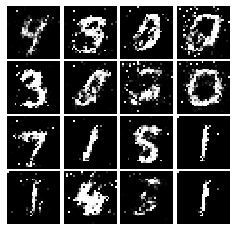

Epoch: 8, Iter: 4200, D: 0.1761, G:0.2272


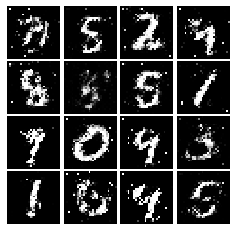

Epoch: 8, Iter: 4220, D: 0.192, G:0.2242


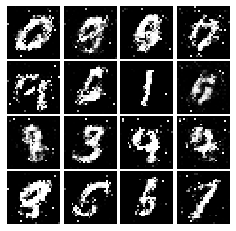

Epoch: 9, Iter: 4240, D: 0.1883, G:0.2221


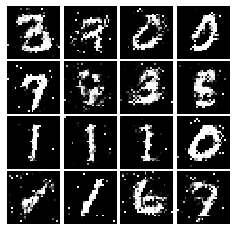

Epoch: 9, Iter: 4260, D: 0.2016, G:0.1831


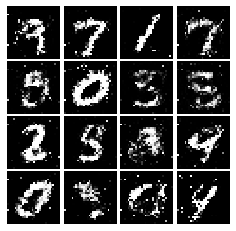

Epoch: 9, Iter: 4280, D: 0.2165, G:0.2089


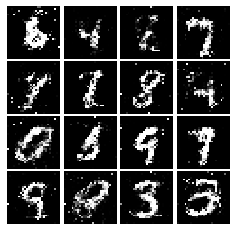

Epoch: 9, Iter: 4300, D: 0.1862, G:0.2016


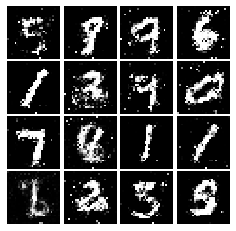

Epoch: 9, Iter: 4320, D: 0.2331, G:0.1957


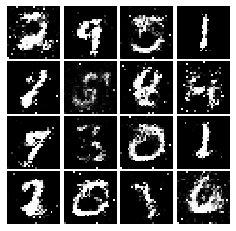

Epoch: 9, Iter: 4340, D: 0.2098, G:0.2171


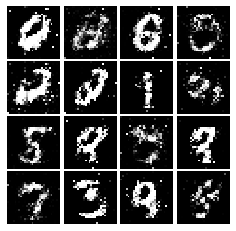

Epoch: 9, Iter: 4360, D: 0.1975, G:0.2149


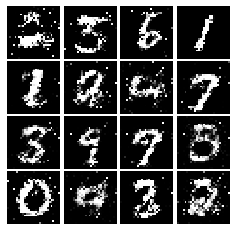

Epoch: 9, Iter: 4380, D: 0.2027, G:0.2012


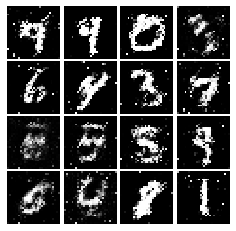

Epoch: 9, Iter: 4400, D: 0.1962, G:0.2028


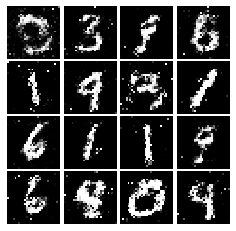

Epoch: 9, Iter: 4420, D: 0.1926, G:0.1926


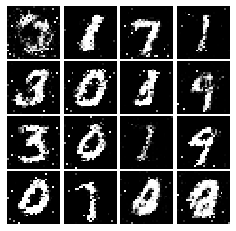

Epoch: 9, Iter: 4440, D: 0.2158, G:0.1935


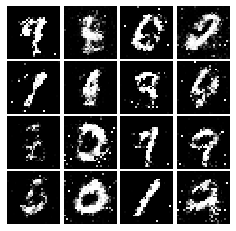

Epoch: 9, Iter: 4460, D: 0.2293, G:0.178


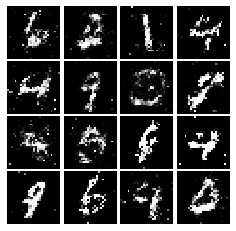

Epoch: 9, Iter: 4480, D: 0.1946, G:0.2112


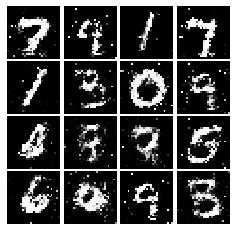

Epoch: 9, Iter: 4500, D: 0.2164, G:0.1876


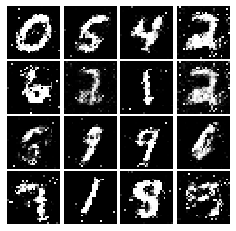

Epoch: 9, Iter: 4520, D: 0.2213, G:0.1664


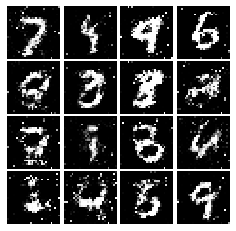

Epoch: 9, Iter: 4540, D: 0.2163, G:0.1777


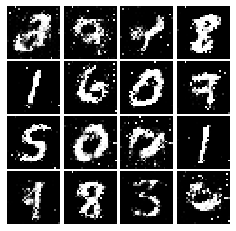

Epoch: 9, Iter: 4560, D: 0.2109, G:0.2326


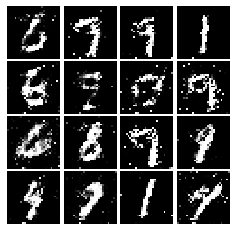

Epoch: 9, Iter: 4580, D: 0.22, G:0.1968


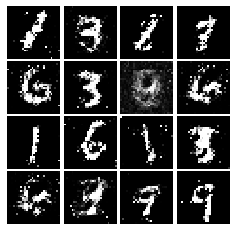

Epoch: 9, Iter: 4600, D: 0.2132, G:0.1757


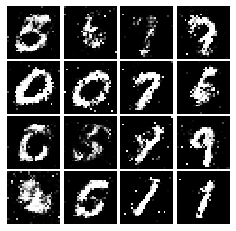

Epoch: 9, Iter: 4620, D: 0.202, G:0.2043


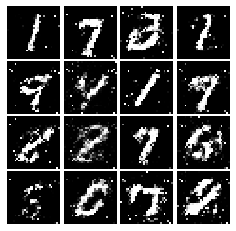

Epoch: 9, Iter: 4640, D: 0.2009, G:0.1842


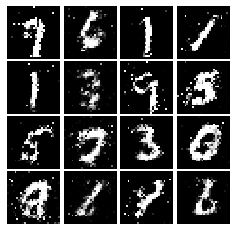

Epoch: 9, Iter: 4660, D: 0.2191, G:0.1879


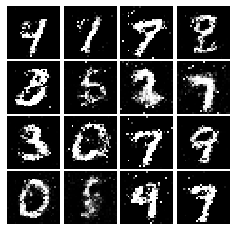

Epoch: 9, Iter: 4680, D: 0.2095, G:0.2114


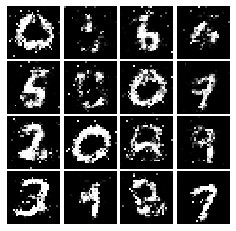

Final images


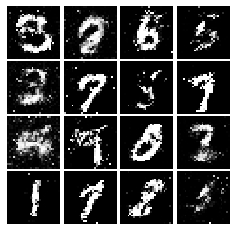

In [48]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [111]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        tf.keras.layers.Lambda(lambda x: tf.reshape(x, [-1, 28, 28, 1]), input_shape=[28, 28, 1]),
        tf.keras.layers.Conv2D(32, [5, 5], strides=1),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D([2, 2], strides=2),
        tf.keras.layers.Conv2D(64, [5, 5], strides=1),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D([2, 2], strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(units=4*4*64),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(units=1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
# model.build(input_shape=[10,24,24,3])
# model.summary()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [138]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    model.add(tf.keras.layers.Dense(1024, input_shape=[96]))
    model.add(tf.keras.layers.ReLU())
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(7*7*128))
    model.add(tf.keras.layers.ReLU())
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Lambda(lambda x: tf.reshape(x, [-1, 7, 7, 128])))
    model.add(tf.keras.layers.Conv2DTranspose(64, [4, 4], strides=[2, 2], padding='SAME'))
    model.add(tf.keras.layers.ReLU())
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2DTranspose(1, [4, 4], strides=[2, 2], padding='SAME', activation='tanh'))
    #model.add(tf.keras.layers.Lambda(lambda x: tf.keras.activations.tanh(x)))
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Incorrect number of parameters in generator. 6689729 instead of 6595521. Check your achitecture.


In [114]:
NOISE_DIM

96

We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.474, G:0.6612


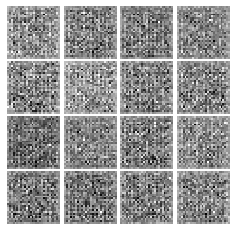

Epoch: 0, Iter: 20, D: 0.218, G:2.278


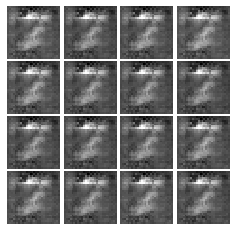

Epoch: 0, Iter: 40, D: 0.07985, G:2.907


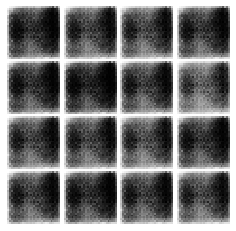

Epoch: 0, Iter: 60, D: 0.03975, G:3.315


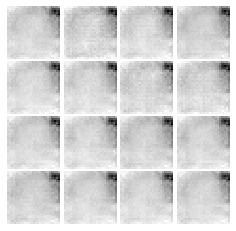

Epoch: 0, Iter: 80, D: 0.01518, G:4.3


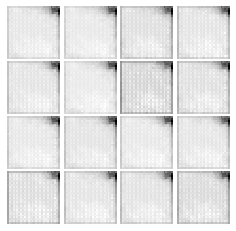

Epoch: 0, Iter: 100, D: 0.01327, G:5.426


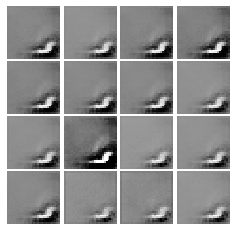

Epoch: 0, Iter: 120, D: 0.4031, G:2.642


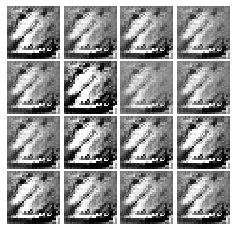

Epoch: 0, Iter: 140, D: 0.03565, G:4.456


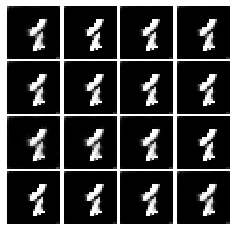

Epoch: 0, Iter: 160, D: 0.3661, G:10.72


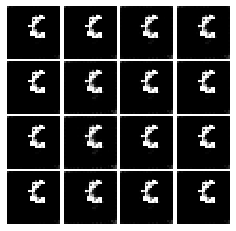

Epoch: 0, Iter: 180, D: 0.02516, G:5.27


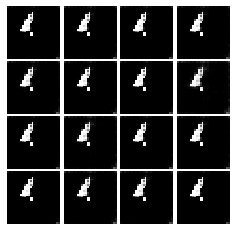

Epoch: 0, Iter: 200, D: 0.03156, G:6.972


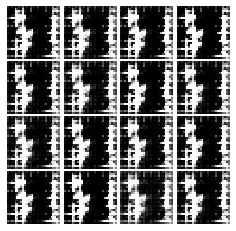

Epoch: 0, Iter: 220, D: 1.052, G:1.771


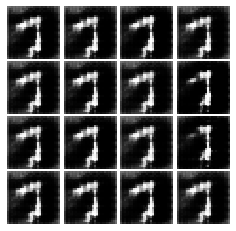

Epoch: 0, Iter: 240, D: 0.617, G:1.572


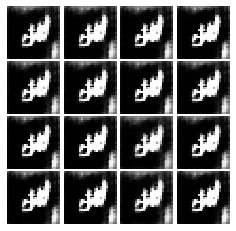

Epoch: 0, Iter: 260, D: 0.2755, G:3.638


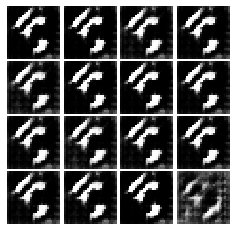

Epoch: 0, Iter: 280, D: 0.4056, G:2.506


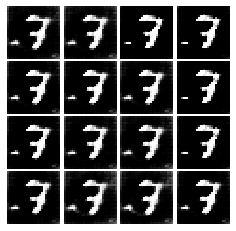

Epoch: 0, Iter: 300, D: 0.6537, G:2.127


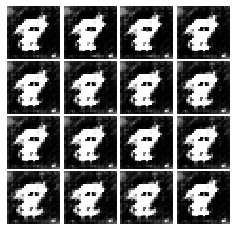

Epoch: 0, Iter: 320, D: 0.2192, G:3.201


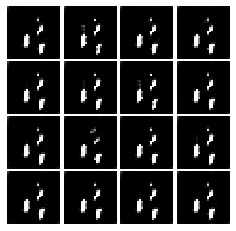

Epoch: 0, Iter: 340, D: 0.07567, G:4.137


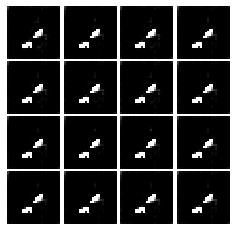

Epoch: 0, Iter: 360, D: 0.05366, G:3.527


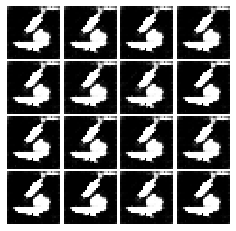

Epoch: 0, Iter: 380, D: 1.076, G:3.045


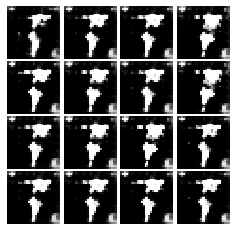

Epoch: 0, Iter: 400, D: 0.6859, G:2.297


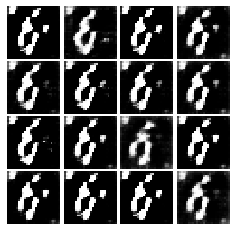

Epoch: 0, Iter: 420, D: 0.3337, G:3.021


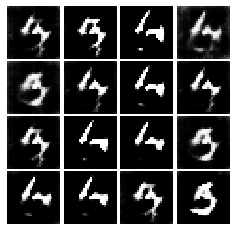

Epoch: 0, Iter: 440, D: 0.6215, G:1.693


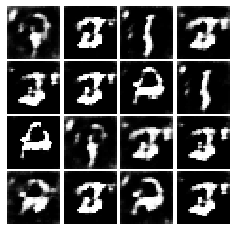

Epoch: 0, Iter: 460, D: 0.7488, G:4.151


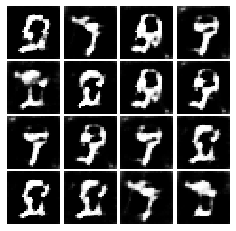

Epoch: 1, Iter: 480, D: 0.2878, G:4.061


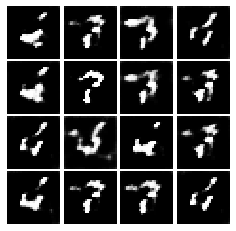

Epoch: 1, Iter: 500, D: 0.8857, G:2.469


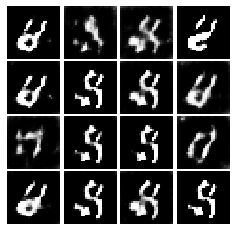

Epoch: 1, Iter: 520, D: 0.5984, G:2.394


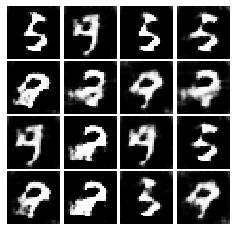

Epoch: 1, Iter: 540, D: 0.7516, G:5.25


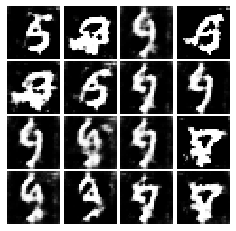

Epoch: 1, Iter: 560, D: 0.5728, G:2.265


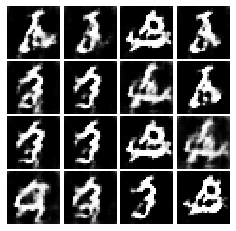

Epoch: 1, Iter: 580, D: 0.5038, G:2.372


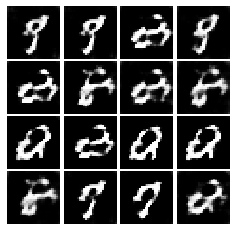

Epoch: 1, Iter: 600, D: 0.8035, G:2.113


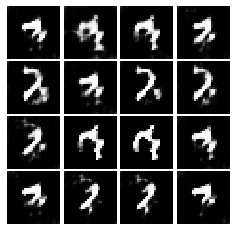

Epoch: 1, Iter: 620, D: 0.4597, G:2.464


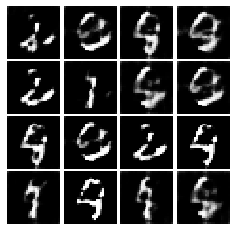

Epoch: 1, Iter: 640, D: 0.7985, G:1.686


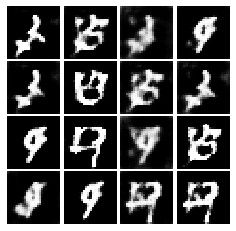

Epoch: 1, Iter: 660, D: 1.054, G:1.747


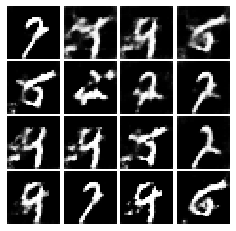

Epoch: 1, Iter: 680, D: 0.4369, G:2.632


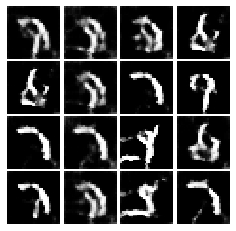

Epoch: 1, Iter: 700, D: 0.4349, G:2.877


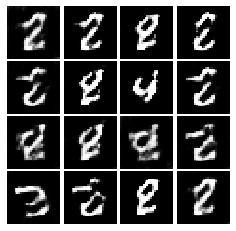

Epoch: 1, Iter: 720, D: 0.5718, G:3.808


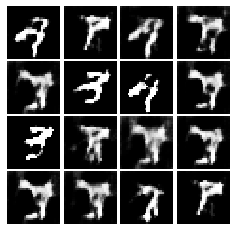

Epoch: 1, Iter: 740, D: 0.8164, G:5.051


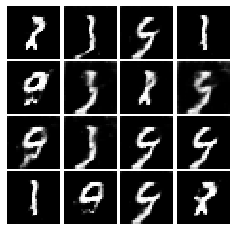

Epoch: 1, Iter: 760, D: 0.2901, G:3.465


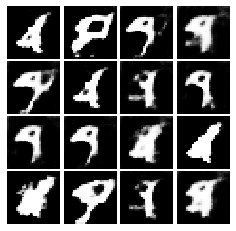

Epoch: 1, Iter: 780, D: 0.6005, G:2.312


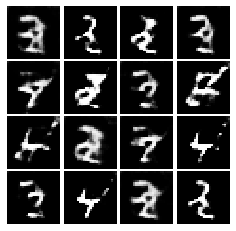

Epoch: 1, Iter: 800, D: 0.5801, G:3.738


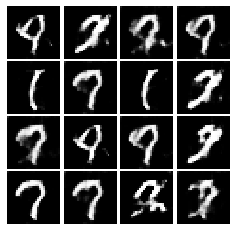

Epoch: 1, Iter: 820, D: 0.4592, G:2.71


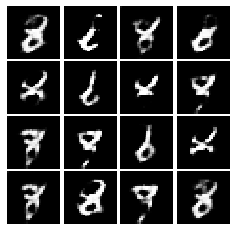

Epoch: 1, Iter: 840, D: 0.4591, G:3.682


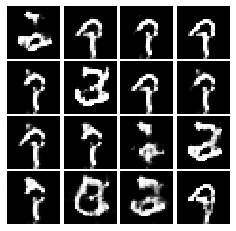

Epoch: 1, Iter: 860, D: 0.1944, G:3.535


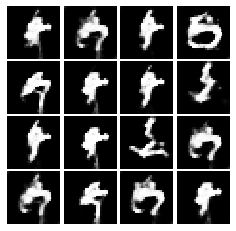

Epoch: 1, Iter: 880, D: 0.2408, G:3.154


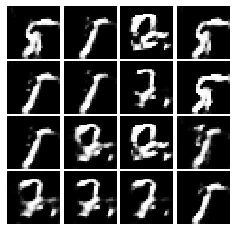

Epoch: 1, Iter: 900, D: 0.4985, G:3.321


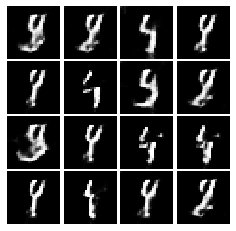

Epoch: 1, Iter: 920, D: 1.207, G:5.127


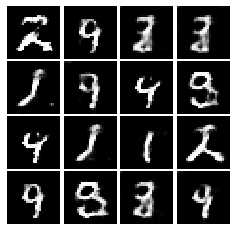

Epoch: 2, Iter: 940, D: 0.7874, G:3.21


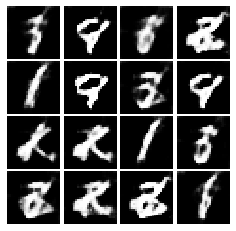

Epoch: 2, Iter: 960, D: 0.3813, G:2.719


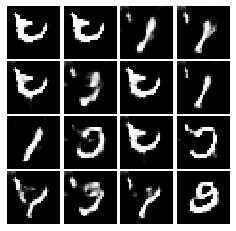

Epoch: 2, Iter: 980, D: 0.714, G:1.586


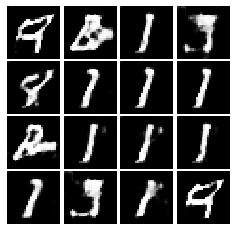

Epoch: 2, Iter: 1000, D: 0.7385, G:2.813


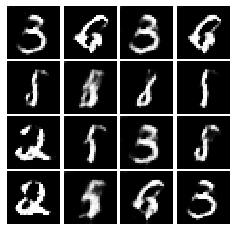

Epoch: 2, Iter: 1020, D: 0.5604, G:3.164


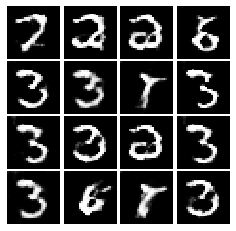

Epoch: 2, Iter: 1040, D: 0.4858, G:6.05


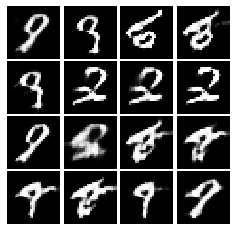

Epoch: 2, Iter: 1060, D: 0.566, G:2.241


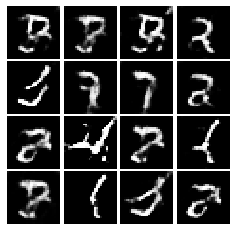

Epoch: 2, Iter: 1080, D: 0.658, G:2.064


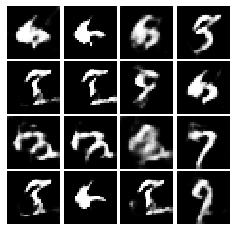

Epoch: 2, Iter: 1100, D: 0.5127, G:2.637


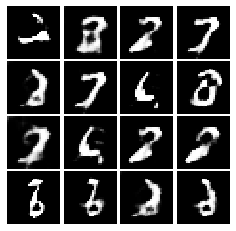

Epoch: 2, Iter: 1120, D: 0.515, G:2.53


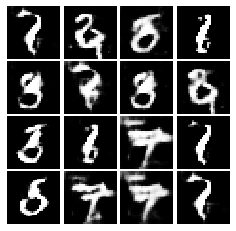

Epoch: 2, Iter: 1140, D: 0.6347, G:3.992


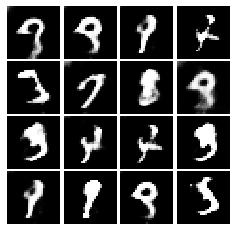

Epoch: 2, Iter: 1160, D: 0.3721, G:3.219


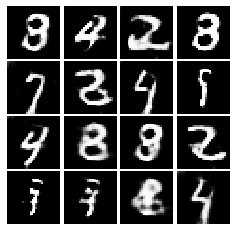

Epoch: 2, Iter: 1180, D: 1.184, G:2.112


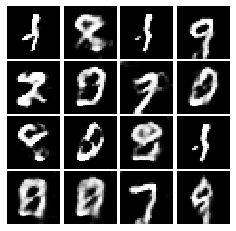

Epoch: 2, Iter: 1200, D: 0.4686, G:2.565


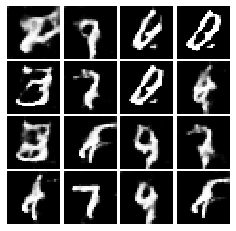

Epoch: 2, Iter: 1220, D: 0.6487, G:1.851


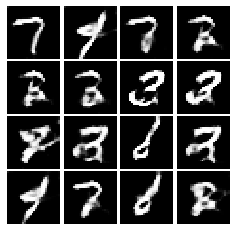

Epoch: 2, Iter: 1240, D: 1.069, G:1.649


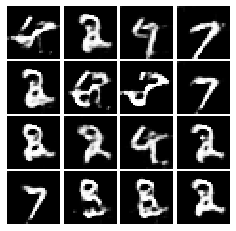

Epoch: 2, Iter: 1260, D: 0.659, G:1.838


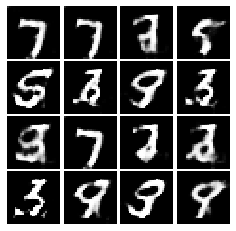

Epoch: 2, Iter: 1280, D: 0.7135, G:2.969


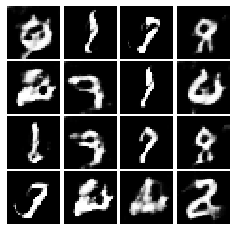

Epoch: 2, Iter: 1300, D: 0.4866, G:2.163


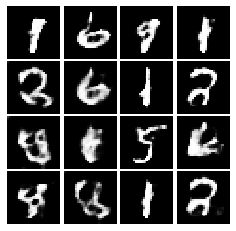

Epoch: 2, Iter: 1320, D: 0.4788, G:2.658


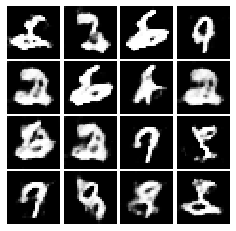

Epoch: 2, Iter: 1340, D: 0.2856, G:3.077


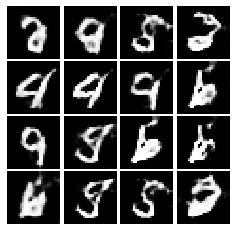

Epoch: 2, Iter: 1360, D: 0.4502, G:2.959


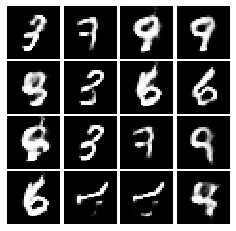

Epoch: 2, Iter: 1380, D: 0.3887, G:3.167


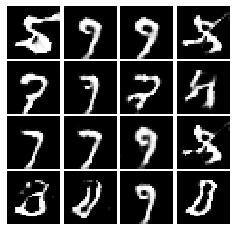

Epoch: 2, Iter: 1400, D: 0.9452, G:6.711


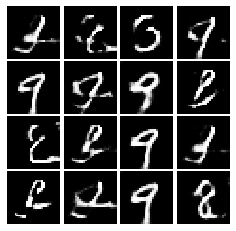

Epoch: 3, Iter: 1420, D: 0.474, G:2.14


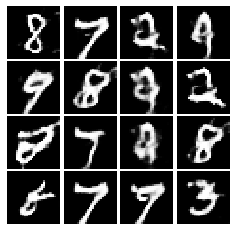

Epoch: 3, Iter: 1440, D: 0.5472, G:2.243


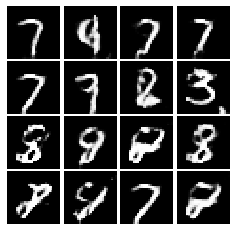

Epoch: 3, Iter: 1460, D: 0.5808, G:1.969


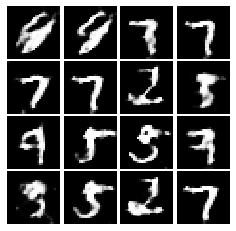

Epoch: 3, Iter: 1480, D: 0.5372, G:2.008


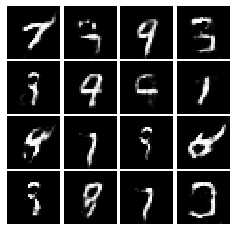

Epoch: 3, Iter: 1500, D: 0.4698, G:2.514


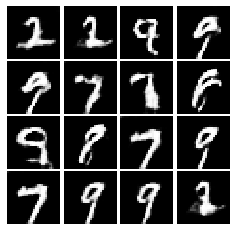

Epoch: 3, Iter: 1520, D: 0.626, G:2.184


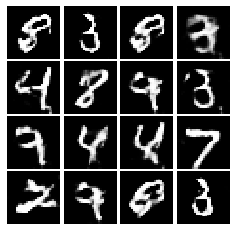

Epoch: 3, Iter: 1540, D: 0.646, G:2.779


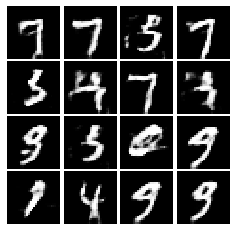

Epoch: 3, Iter: 1560, D: 0.6819, G:1.71


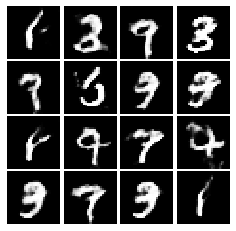

Epoch: 3, Iter: 1580, D: 0.8088, G:3.144


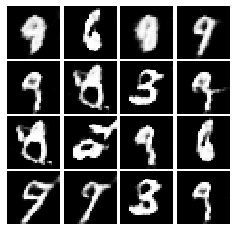

Epoch: 3, Iter: 1600, D: 0.7413, G:2.802


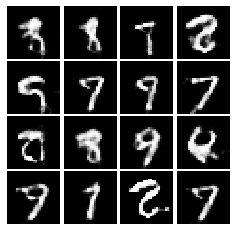

Epoch: 3, Iter: 1620, D: 0.4967, G:3.319


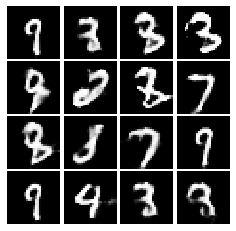

Epoch: 3, Iter: 1640, D: 0.4872, G:2.592


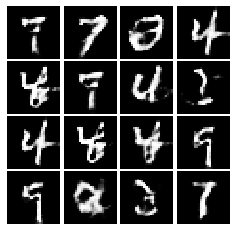

Epoch: 3, Iter: 1660, D: 0.6453, G:4.083


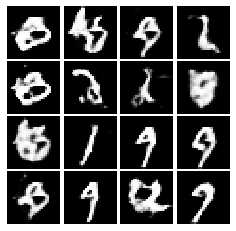

Epoch: 3, Iter: 1680, D: 0.5749, G:3.642


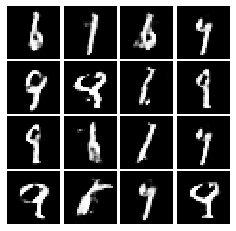

Epoch: 3, Iter: 1700, D: 0.5886, G:2.916


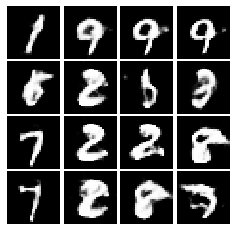

Epoch: 3, Iter: 1720, D: 0.5109, G:2.812


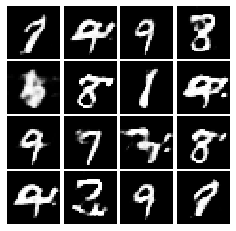

Epoch: 3, Iter: 1740, D: 0.625, G:1.985


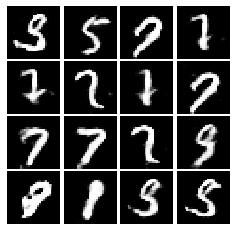

Epoch: 3, Iter: 1760, D: 0.4296, G:3.023


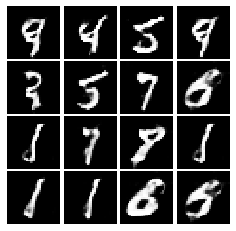

Epoch: 3, Iter: 1780, D: 0.5355, G:2.133


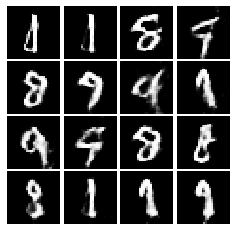

Epoch: 3, Iter: 1800, D: 0.3973, G:2.567


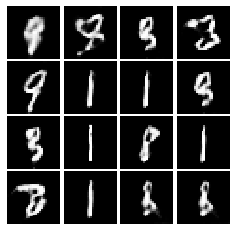

Epoch: 3, Iter: 1820, D: 0.6188, G:1.66


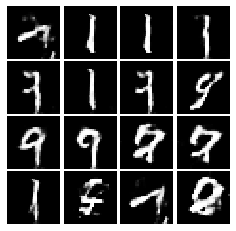

Epoch: 3, Iter: 1840, D: 0.5915, G:2.765


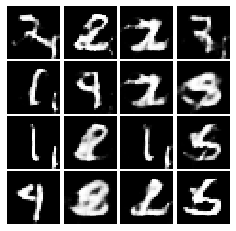

Epoch: 3, Iter: 1860, D: 0.5683, G:2.193


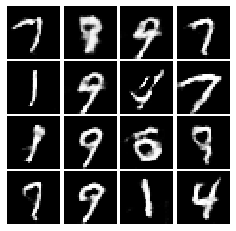

Epoch: 4, Iter: 1880, D: 0.5462, G:1.808


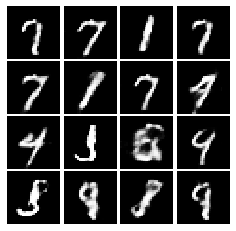

Epoch: 4, Iter: 1900, D: 0.614, G:1.662


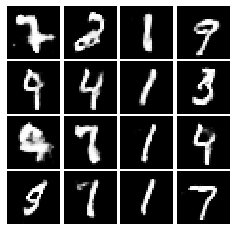

Epoch: 4, Iter: 1920, D: 0.6478, G:2.228


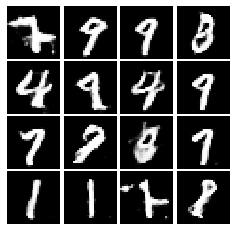

Epoch: 4, Iter: 1940, D: 0.4479, G:2.305


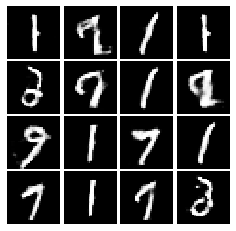

Epoch: 4, Iter: 1960, D: 0.5443, G:2.161


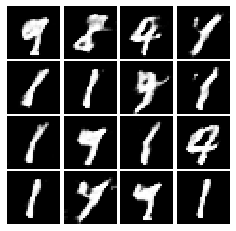

Epoch: 4, Iter: 1980, D: 0.5409, G:1.854


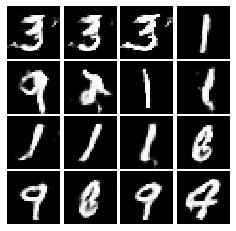

Epoch: 4, Iter: 2000, D: 0.9425, G:0.9756


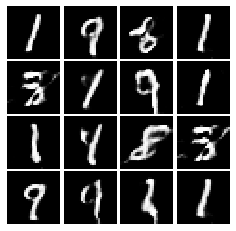

Epoch: 4, Iter: 2020, D: 0.5505, G:2.277


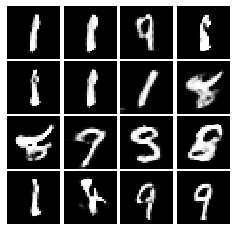

Epoch: 4, Iter: 2040, D: 0.5759, G:2.748


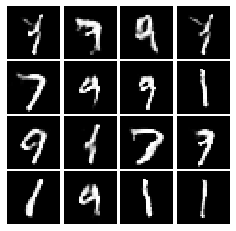

Epoch: 4, Iter: 2060, D: 0.463, G:2.421


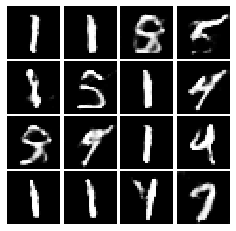

Epoch: 4, Iter: 2080, D: 0.6711, G:1.63


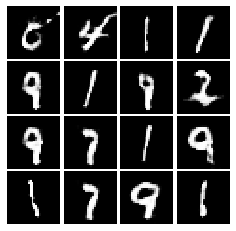

Epoch: 4, Iter: 2100, D: 0.4531, G:2.113


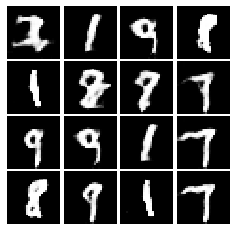

Epoch: 4, Iter: 2120, D: 0.5836, G:1.79


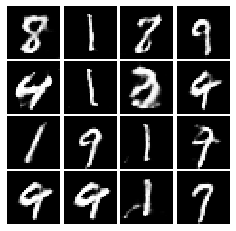

Epoch: 4, Iter: 2140, D: 0.7334, G:1.924


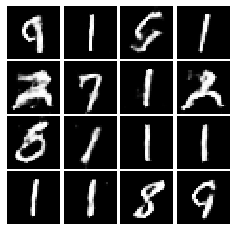

Epoch: 4, Iter: 2160, D: 0.73, G:1.701


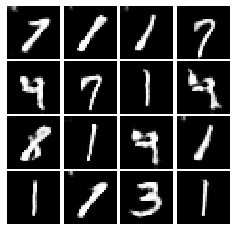

Epoch: 4, Iter: 2180, D: 0.6217, G:1.635


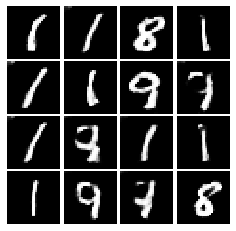

Epoch: 4, Iter: 2200, D: 0.6755, G:2.195


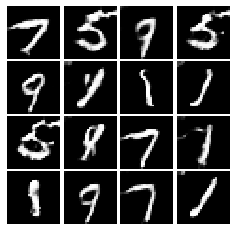

Epoch: 4, Iter: 2220, D: 0.5563, G:2.665


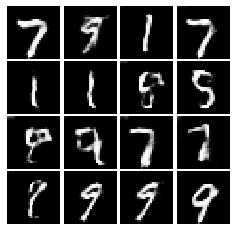

Epoch: 4, Iter: 2240, D: 0.6625, G:2.299


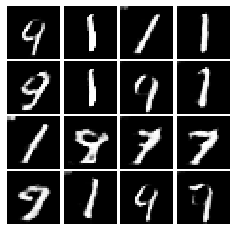

Epoch: 4, Iter: 2260, D: 0.4916, G:2.364


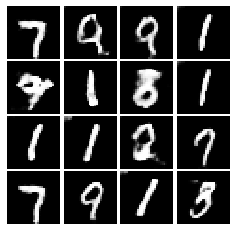

Epoch: 4, Iter: 2280, D: 0.4428, G:2.509


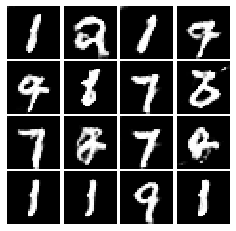

Epoch: 4, Iter: 2300, D: 0.5824, G:2.845


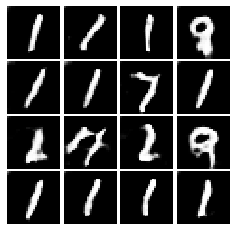

Epoch: 4, Iter: 2320, D: 0.7207, G:3.1


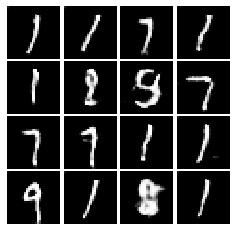

Epoch: 4, Iter: 2340, D: 0.8865, G:3.222


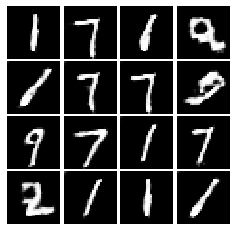

Final images


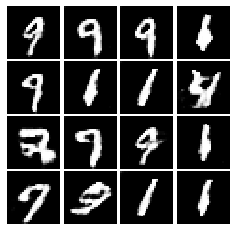

In [139]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

In [130]:
128*96

12288

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   | 1.01  | 1.0199|       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   | 0.99  |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
